<a href="https://colab.research.google.com/github/samikshagadhave/YOLOv6_model/blob/main/Training_YOLOv6_on_T53_dataset_with_augumented_data_of_brightness_type_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/meituan/YOLOv6
%cd YOLOv6
!pip install -r requirements.txt

Cloning into 'YOLOv6'...
remote: Enumerating objects: 3669, done.
remote: Counting objects: 100% (965/965), done.
remote: Compressing objects: 100% (206/206), done.
remote: Total 3669 (delta 834), reused 769 (delta 759), pack-reused 2704
Receiving objects: 100% (3669/3669), 46.93 MiB | 18.31 MiB/s, done.
Resolving deltas: 100% (2186/2186), done.
/content/YOLOv6
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 55.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.6/14.6 MB 70.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 73.1 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.5
    Uninstalling numpy-1.23.5:
      Successfully uninstalled numpy-1.23.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
numba 0.56.4 requires numpy<1.24,>=1.18, but you have numpy 1.25.2 wh

In [ ]:
!pip install numpy==1.23.4

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 58.9 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.25.2
    Uninstalling numpy-1.25.2:
      Successfully uninstalled numpy-1.25.2


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="mwbsdPvkmXbwf9oRwN1g")
project = rf.workspace("samiksha-gadhave").project("transmission-dataset-t53")
dataset = project.version(4).download("mt-yolov6")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 23.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.3/59.3 kB 8.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.6 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9655 sha256=2b553753c341ae9c4e25c11966de5c00617d8860914a9d431d1aa6ed86eb980a
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
     

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Transmission-dataset-T53-4 in mt-yolov6:: 100%|██████████| 3319/3319 [00:01<00:00, 1841.64it/s]


In [ ]:
!python tools/train.py --batch 32 --conf configs/yolov6s.py --epochs 100 --img-size 416 --data {dataset.location}/data.yaml --device 0

2023-08-23 05:53:53.685066: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-23 05:53:55.686028: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Using 1 GPU for training... 
training args are: Namespace(data_path='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', conf_file='configs/yolov6s.py', img_size=416, rect=False, batch_size=32, epochs=100, workers=8, device='0', eval_interval=20, eval_final_only=False, heavy_eval_range=50, check_images=False, check_labels=False, output_dir='./runs/train', name='exp', dist_url='env://', gpu_count=0, local_rank=-1, resume=False, write_trainbatch_tb=False, stop_aug_last_n_epoch=15, save_ckpt_on_last_n_epoch=-1, distill=False, distill_feat=False, quan

In [ ]:
!python tools/eval.py --data {dataset.location}/data.yaml --img-size 416 --weights runs/train/exp/weights/best_ckpt.pt --device 0


Namespace(data='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', weights='runs/train/exp/weights/best_ckpt.pt', batch_size=32, img_size=416, conf_thres=0.03, iou_thres=0.65, task='val', device='0', half=False, save_dir='runs/val/', name='exp', shrink_size=0, infer_on_rect=True, reproduce_640_eval=False, eval_config_file='./configs/experiment/eval_640_repro.py', do_coco_metric=True, do_pr_metric=False, plot_curve=True, plot_confusion_matrix=False, verbose=False, config_file='', specific_shape=False, height=None, width=None)
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
Model Summary: Params: 18.50M, Gflops: 19.09
img record infomation path is:Transmission-dataset-T53-4/images/.valid_cache.json
Val: Checking formats of labels with 2 process(es): 
139 label(s) found, 0 label(s) missing, 0 label(s) empty, 0 invalid label files: 100% 139/139 [00:00<00:00, 2494.63it/s]
Convert to COCO format
100% 139/139 [00:00<00:00, 3214

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0480_jpg.rf.802e67bd4d43df883a95331596a6d50c.jpg  --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0480_jpg.rf.802e67bd4d43df883a95331596a6d50c.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00,  7.80it/s]
Results saved to runs/inference/exp


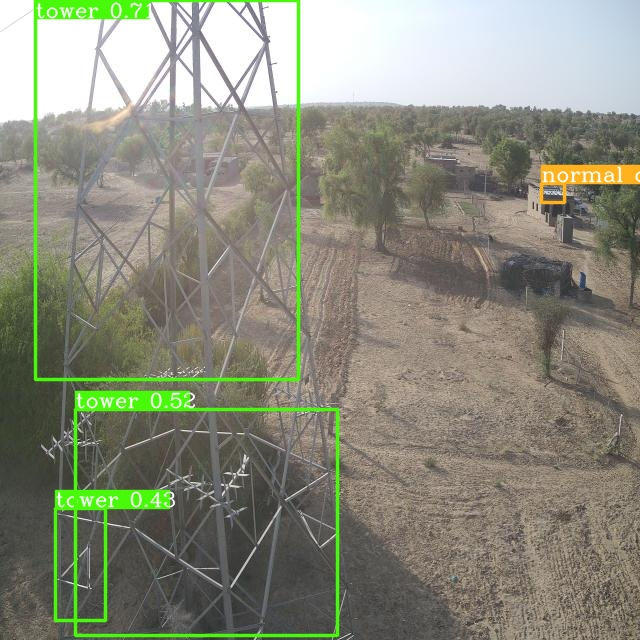

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0480_jpg.rf.802e67bd4d43df883a95331596a6d50c.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0482-1_jpg.rf.393487117f567f491724e8f81088309f.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0482-1_jpg.rf.393487117f567f491724e8f81088309f.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 21.90it/s]
Results saved to runs/inference/exp


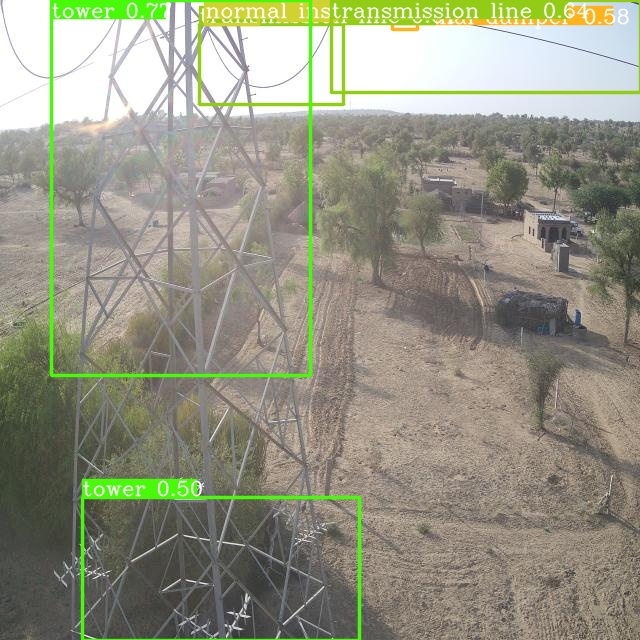

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0482-1_jpg.rf.393487117f567f491724e8f81088309f.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0488-4_jpg.rf.3525b1e5ce1c4a9c6410d1d63e0e1eb8.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0488-4_jpg.rf.3525b1e5ce1c4a9c6410d1d63e0e1eb8.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 12.88it/s]
Results saved to runs/inference/exp


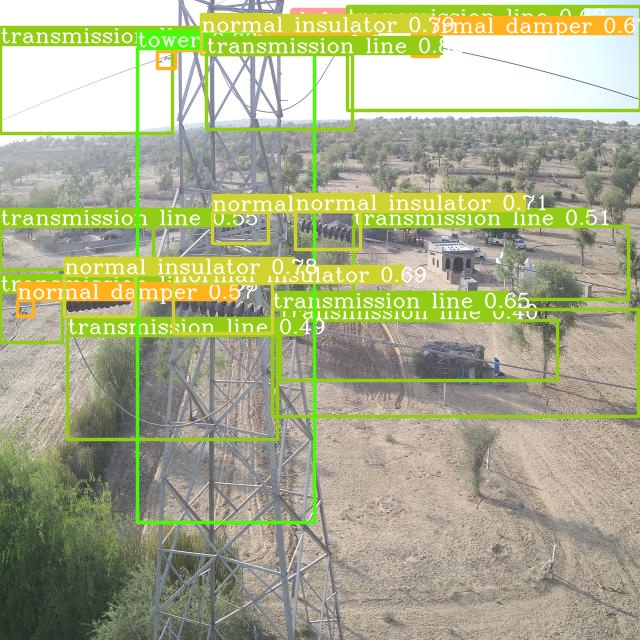

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0488-4_jpg.rf.3525b1e5ce1c4a9c6410d1d63e0e1eb8.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0494-2_jpg.rf.7183c2d9e80cae1889b2dee6ff3bc51c.jpg  --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0494-2_jpg.rf.7183c2d9e80cae1889b2dee6ff3bc51c.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 11.88it/s]
Results saved to runs/inference/exp


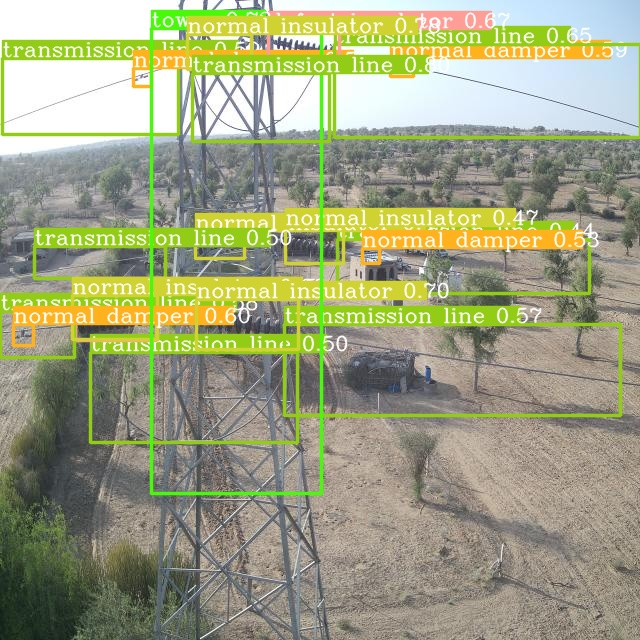

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0494-2_jpg.rf.7183c2d9e80cae1889b2dee6ff3bc51c.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0498-2_jpg.rf.66967cdcc44001d25766307926ac3dd5.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0498-2_jpg.rf.66967cdcc44001d25766307926ac3dd5.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 20.19it/s]
Results saved to runs/inference/exp


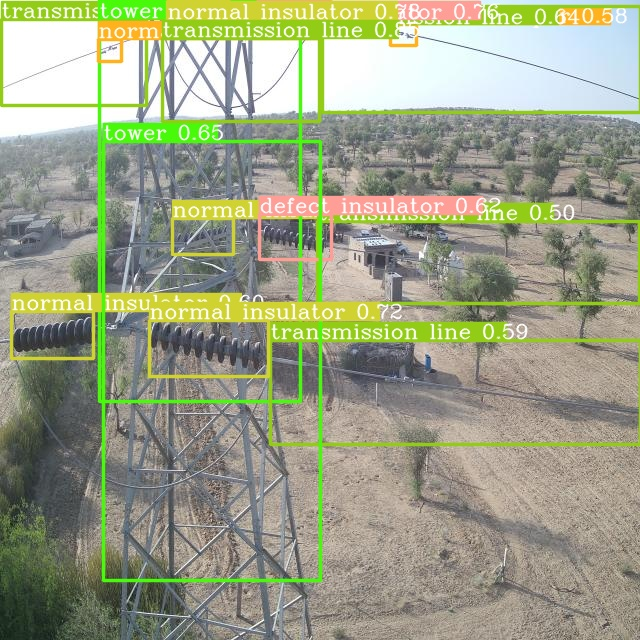

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0498-2_jpg.rf.66967cdcc44001d25766307926ac3dd5.jpg'):#assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0500-3_jpg.rf.a4675a0e5b2011dbebc0603f1dc4be50.jpg  --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0500-3_jpg.rf.a4675a0e5b2011dbebc0603f1dc4be50.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 19.56it/s]
Results saved to runs/inference/exp


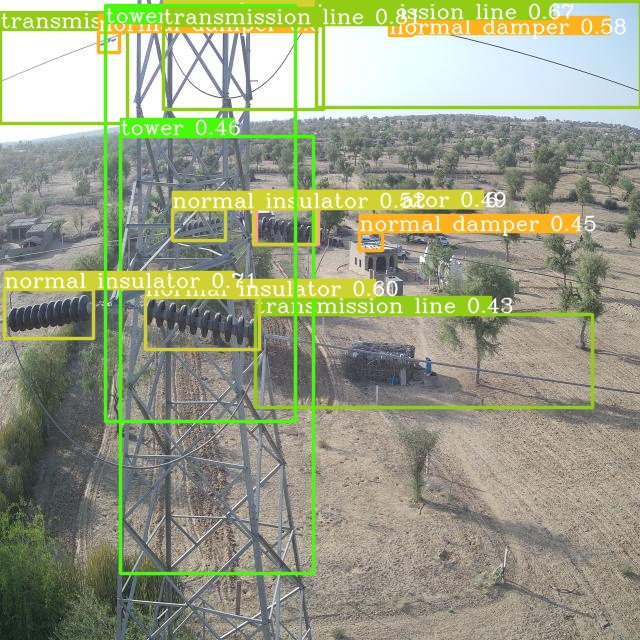

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0500-3_jpg.rf.a4675a0e5b2011dbebc0603f1dc4be50.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0502_jpg.rf.f4873a2c43852633b3b4a091161607bf.jpg  --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0502_jpg.rf.f4873a2c43852633b3b4a091161607bf.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 19.85it/s]
Results saved to runs/inference/exp


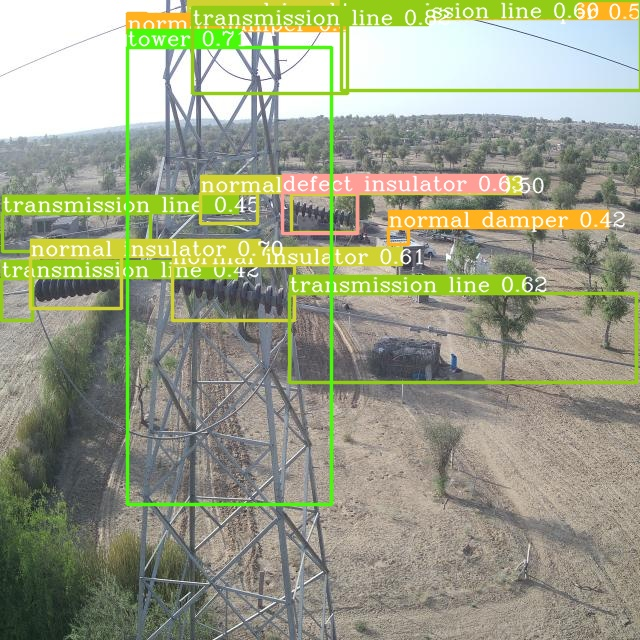

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0502_jpg.rf.f4873a2c43852633b3b4a091161607bf.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0506-2_jpg.rf.ec66389f2bcfdd34c58c26a19fd2c4ac.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0506-2_jpg.rf.ec66389f2bcfdd34c58c26a19fd2c4ac.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 20.13it/s]
Results saved to runs/inference/exp


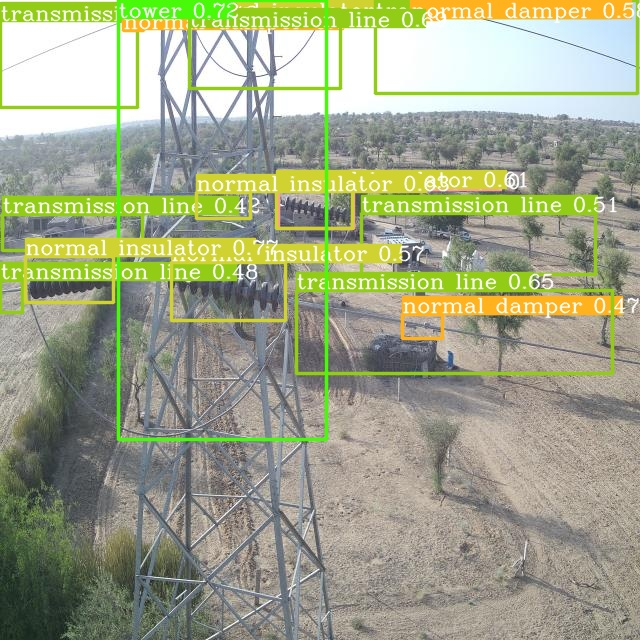

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0506-2_jpg.rf.ec66389f2bcfdd34c58c26a19fd2c4ac.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0510-3_jpg.rf.527891783c654cf496f670baab6b60bc.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0510-3_jpg.rf.527891783c654cf496f670baab6b60bc.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 19.87it/s]
Results saved to runs/inference/exp


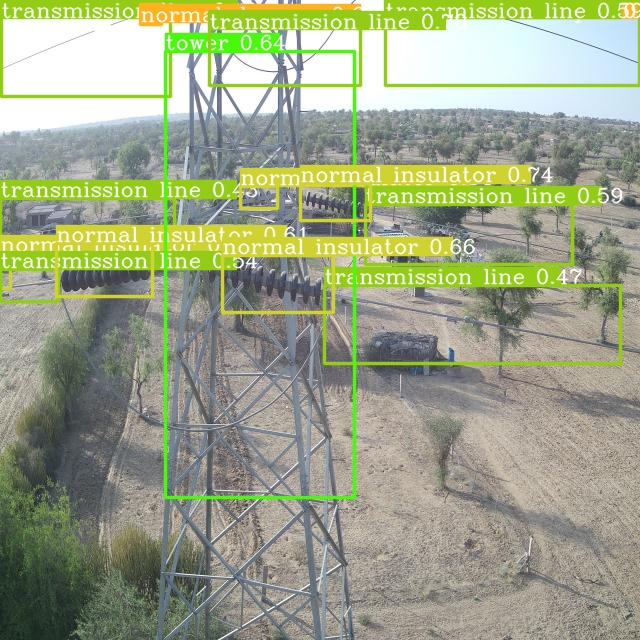

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0510-3_jpg.rf.527891783c654cf496f670baab6b60bc.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!mkdir save_images_test

In [ ]:
import cv2
import os
import random
label_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/labels'
raw_images_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/images'
save_images_folder = r'/content/YOLOv6/save_images_test'
name_list_path = r'/content/YOLOv6/Transmission-dataset-T53-4/labels/test'
classes_path = r'/content/YOLOv6/Transmission-dataset-T53-4'
image_name=r'./runs/inference/exp/DJI_0510-3_jpg.rf.527891783c654cf496f670baab6b60bc.jpg'
label=name_of_class='defect transmission line'

def plot_one_box(x, image, color=None, label=name_of_class,line_thickness=None):

    tl = line_thickness or round(0.002 * (image.shape[0] + image.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(image, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label:
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(str(label), 0, fontScale=tl / 3,thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(image, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(image, str(label), (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
def draw_box_on_image(image_name, classes_path, label_folder, raw_images_folder, save_images_folder ):
    txt_path  = r"/content/YOLOv6/Transmission-dataset-T53-4/labels/test/DJI_0510-3_jpg.rf.527891783c654cf496f670baab6b60bc.txt"
    print(image_name)
    if image_name == '.DS_Store':
        return 0
    image_path = r"./runs/inference/exp/DJI_0510-3_jpg.rf.527891783c654cf496f670baab6b60bc.jpg"
    save_file_path = r"/content/YOLOv6/save_images_test/DJI_0510-3"
    source_file = open(txt_path) if os.path.exists(txt_path) else []
    image = cv2.imread(image_path)
    try:
        height, width, channels = image.shape
    except:
        print('no shape info.')
        return 0
    box_number = 0
    for line in source_file:
        staff = line.split()
        class_idx = int(staff[0])
        x_center, y_center, w, h = float(staff[1])*width, float(staff[2])*height, float(staff[3])*width, float(staff[4])*height
        x1 = round(x_center-w/2)
        y1 = round(y_center-h/2)
        x2 = round(x_center+w/2)
        y2 = round(y_center+h/2)
        plot_one_box([x1,y1,x2,y2], image,  label=name_of_class, line_thickness=None)
        cv2.imwrite(r"/content/YOLOv6/save_images_test/DJI_0510-3.jpg",image)
        box_number += 1
        return box_number
draw_box_on_image(image_name, classes_path,  label_folder, raw_images_folder, save_images_folder )





./runs/inference/exp/DJI_0510-3_jpg.rf.527891783c654cf496f670baab6b60bc.jpg


1

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0510_jpg.rf.d71a59756831fed9ecf6757080ed4b9c.jpg  --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0510_jpg.rf.d71a59756831fed9ecf6757080ed4b9c.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 15.62it/s]
Results saved to runs/inference/exp


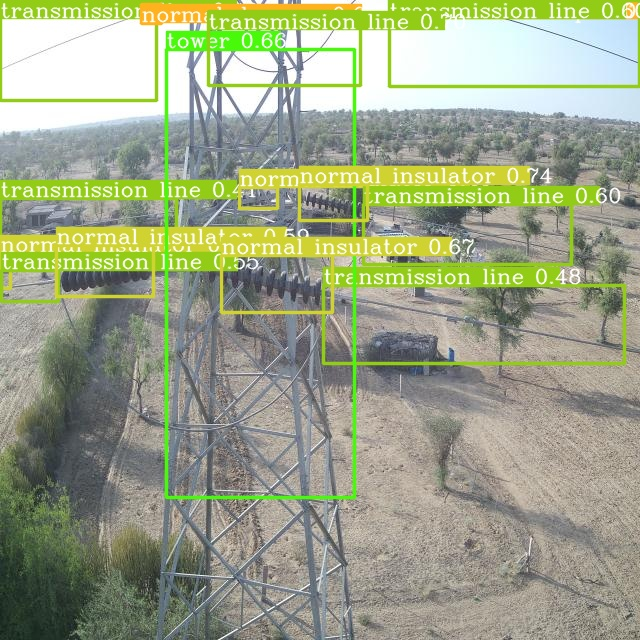

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0510_jpg.rf.d71a59756831fed9ecf6757080ed4b9c.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0512_jpg.rf.1108523bcbe4ac2170f3da0964fb78d2.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0512_jpg.rf.1108523bcbe4ac2170f3da0964fb78d2.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 18.93it/s]
Results saved to runs/inference/exp


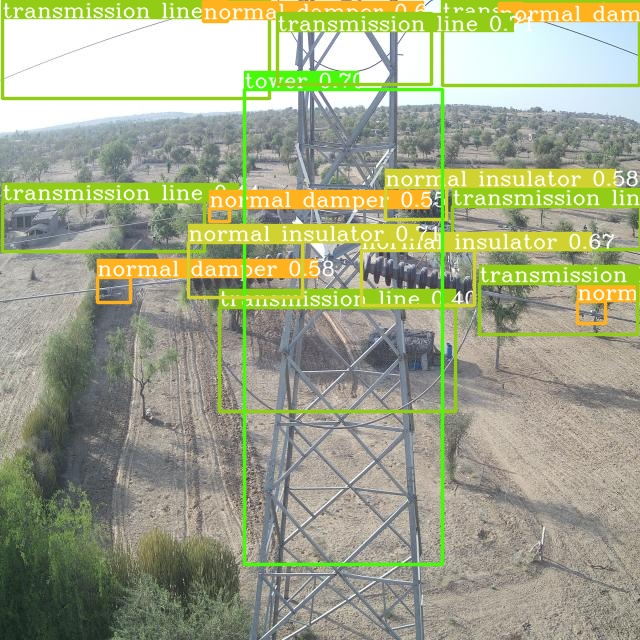

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0512_jpg.rf.1108523bcbe4ac2170f3da0964fb78d2.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0512_jpg.rf.79afa44e9c6914e07e3cb8fe0b8514d0.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0512_jpg.rf.79afa44e9c6914e07e3cb8fe0b8514d0.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 18.51it/s]
Results saved to runs/inference/exp


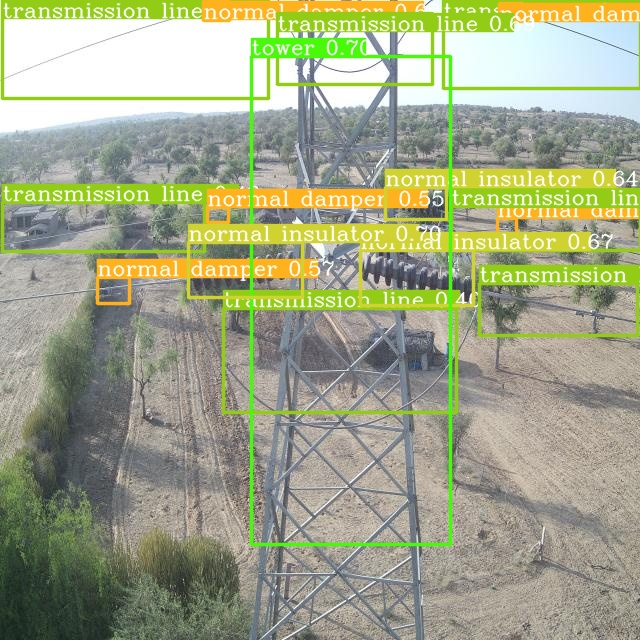

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0512_jpg.rf.79afa44e9c6914e07e3cb8fe0b8514d0.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0514-2_jpg.rf.5f395a5160baf6d7ffb641e745a8c005.jpg  --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0514-2_jpg.rf.5f395a5160baf6d7ffb641e745a8c005.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 15.67it/s]
Results saved to runs/inference/exp


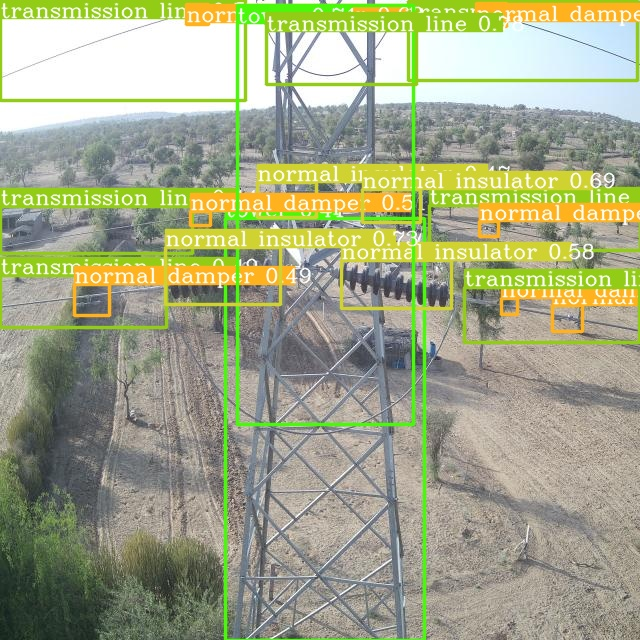

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0514-2_jpg.rf.5f395a5160baf6d7ffb641e745a8c005.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0522-3_jpg.rf.db30961357137e0c82cfdf22a667c994.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0522-3_jpg.rf.db30961357137e0c82cfdf22a667c994.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 18.84it/s]
Results saved to runs/inference/exp


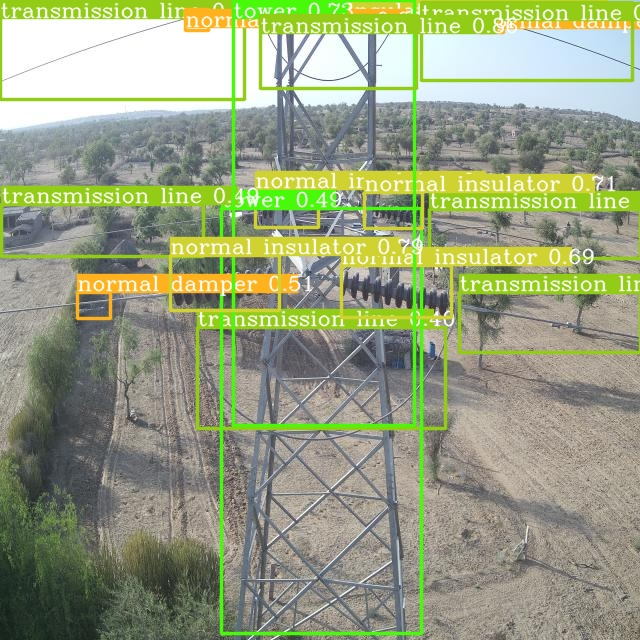

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0522-3_jpg.rf.db30961357137e0c82cfdf22a667c994.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0526_jpg.rf.b413bab3bc80a66b00adee966277da11.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0526_jpg.rf.b413bab3bc80a66b00adee966277da11.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 15.19it/s]
Results saved to runs/inference/exp


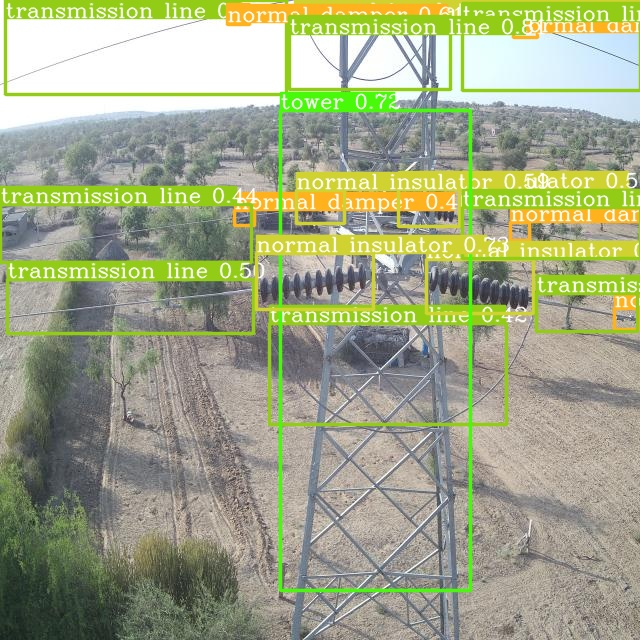

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0526_jpg.rf.b413bab3bc80a66b00adee966277da11.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0536_jpg.rf.30e84cefc96b4cc8ab26406fabca803e.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0536_jpg.rf.30e84cefc96b4cc8ab26406fabca803e.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 18.70it/s]
Results saved to runs/inference/exp


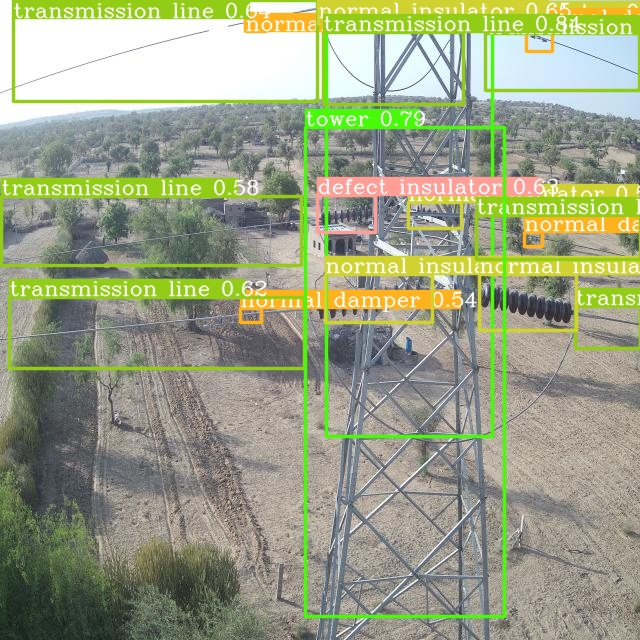

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0536_jpg.rf.30e84cefc96b4cc8ab26406fabca803e.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
import cv2
import os
import random
label_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/labels'
raw_images_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/images'
save_images_folder = r'/content/YOLOv6/save_images_test'
name_list_path = r'/content/YOLOv6/Transmission-dataset-T53-4/labels/test'
classes_path = r'/content/YOLOv6/Transmission-dataset-T53-4'
image_name=r'./runs/inference/exp/DJI_0536_jpg.rf.30e84cefc96b4cc8ab26406fabca803e.jpg'
label=name_of_class='defect transmission line'

def plot_one_box(x, image, color=None, label=name_of_class,line_thickness=None):

    tl = line_thickness or round(0.002 * (image.shape[0] + image.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(image, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label:
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(str(label), 0, fontScale=tl / 3,thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(image, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(image, str(label), (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
def draw_box_on_image(image_name, classes_path, label_folder, raw_images_folder, save_images_folder ):
    txt_path  = r"/content/YOLOv6/Transmission-dataset-T53-4/labels/test/DJI_0536_jpg.rf.30e84cefc96b4cc8ab26406fabca803e.txt"
    print(image_name)
    if image_name == '.DS_Store':
        return 0
    image_path = r"./runs/inference/exp/DJI_0536_jpg.rf.30e84cefc96b4cc8ab26406fabca803e.jpg"
    save_file_path = r"/content/YOLOv6/save_images_test/DJI_0536"
    source_file = open(txt_path) if os.path.exists(txt_path) else []
    image = cv2.imread(image_path)
    try:
        height, width, channels = image.shape
    except:
        print('no shape info.')
        return 0
    box_number = 0
    for line in source_file:
        staff = line.split()
        class_idx = int(staff[0])
        x_center, y_center, w, h = float(staff[1])*width, float(staff[2])*height, float(staff[3])*width, float(staff[4])*height
        x1 = round(x_center-w/2)
        y1 = round(y_center-h/2)
        x2 = round(x_center+w/2)
        y2 = round(y_center+h/2)
        plot_one_box([x1,y1,x2,y2], image,  label=name_of_class, line_thickness=None)
        cv2.imwrite(r"/content/YOLOv6/save_images_test/DJI_0536.jpg",image)
        box_number += 1
        return box_number
draw_box_on_image(image_name, classes_path,  label_folder, raw_images_folder, save_images_folder )





./runs/inference/exp/DJI_0536_jpg.rf.30e84cefc96b4cc8ab26406fabca803e.jpg


1

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0538_jpg.rf.5db3146ab3ba060ae08e60e228b30b98.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0538_jpg.rf.5db3146ab3ba060ae08e60e228b30b98.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 14.42it/s]
Results saved to runs/inference/exp


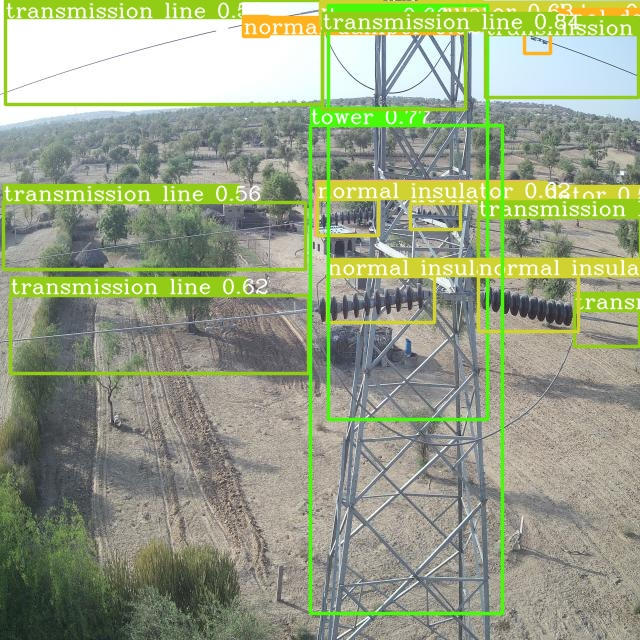

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0538_jpg.rf.5db3146ab3ba060ae08e60e228b30b98.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
import cv2
import os
import random
label_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/labels'
raw_images_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/images'
save_images_folder = r'/content/YOLOv6/save_images_test'
name_list_path = r'/content/YOLOv6/Transmission-dataset-T53-4/labels/test'
classes_path = r'/content/YOLOv6/Transmission-dataset-T53-4'
image_name=r'./runs/inference/exp/DJI_0538_jpg.rf.5db3146ab3ba060ae08e60e228b30b98.jpg'
label=name_of_class='defect transmission line'

def plot_one_box(x, image, color=None, label=name_of_class,line_thickness=None):

    tl = line_thickness or round(0.002 * (image.shape[0] + image.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(image, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label:
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(str(label), 0, fontScale=tl / 3,thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(image, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(image, str(label), (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
def draw_box_on_image(image_name, classes_path, label_folder, raw_images_folder, save_images_folder ):
    txt_path  = r"/content/YOLOv6/Transmission-dataset-T53-4/labels/test/DJI_0538_jpg.rf.5db3146ab3ba060ae08e60e228b30b98.txt"
    print(image_name)
    if image_name == '.DS_Store':
        return 0
    image_path = r"./runs/inference/exp/DJI_0538_jpg.rf.5db3146ab3ba060ae08e60e228b30b98.jpg"
    save_file_path = r"/content/YOLOv6/save_images_test/DJI_0538"
    source_file = open(txt_path) if os.path.exists(txt_path) else []
    image = cv2.imread(image_path)
    try:
        height, width, channels = image.shape
    except:
        print('no shape info.')
        return 0
    box_number = 0
    for line in source_file:
        staff = line.split()
        class_idx = int(staff[0])
        x_center, y_center, w, h = float(staff[1])*width, float(staff[2])*height, float(staff[3])*width, float(staff[4])*height
        x1 = round(x_center-w/2)
        y1 = round(y_center-h/2)
        x2 = round(x_center+w/2)
        y2 = round(y_center+h/2)
        plot_one_box([x1,y1,x2,y2], image,  label=name_of_class, line_thickness=None)
        cv2.imwrite(r"/content/YOLOv6/save_images_test/DJI_0538.jpg",image)
        box_number += 1
        return box_number
draw_box_on_image(image_name, classes_path,  label_folder, raw_images_folder, save_images_folder )





./runs/inference/exp/DJI_0538_jpg.rf.5db3146ab3ba060ae08e60e228b30b98.jpg


1

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0540-3_jpg.rf.6a19e334149722ef46aa58fe52870f38.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0540-3_jpg.rf.6a19e334149722ef46aa58fe52870f38.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 19.51it/s]
Results saved to runs/inference/exp


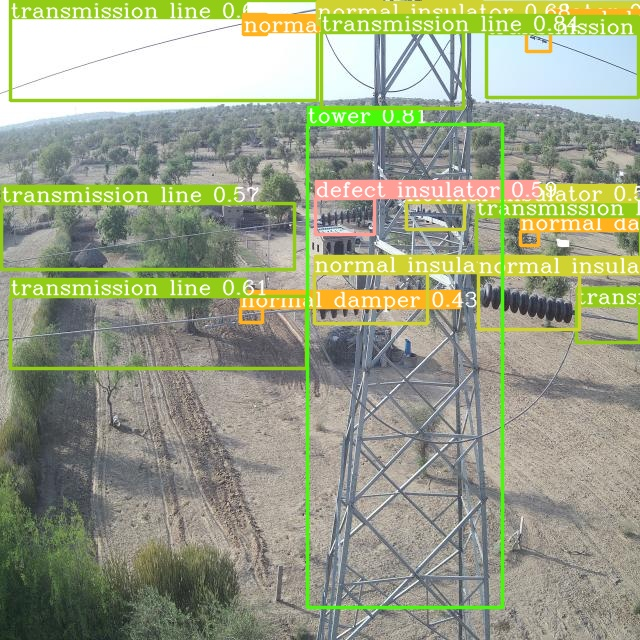

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0540-3_jpg.rf.6a19e334149722ef46aa58fe52870f38.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
import cv2
import os
import random
label_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/labels'
raw_images_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/images'
save_images_folder = r'/content/YOLOv6/save_images_test'
name_list_path = r'/content/YOLOv6/Transmission-dataset-T53-4/labels/test'
classes_path = r'/content/YOLOv6/Transmission-dataset-T53-4'
image_name=r'./runs/inference/exp/DJI_0540-3_jpg.rf.6a19e334149722ef46aa58fe52870f38.jpg'
label=name_of_class='defect transmission line'

def plot_one_box(x, image, color=None, label=name_of_class,line_thickness=None):

    tl = line_thickness or round(0.002 * (image.shape[0] + image.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(image, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label:
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(str(label), 0, fontScale=tl / 3,thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(image, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(image, str(label), (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
def draw_box_on_image(image_name, classes_path, label_folder, raw_images_folder, save_images_folder ):
    txt_path  = r"/content/YOLOv6/Transmission-dataset-T53-4/labels/test/DJI_0540-3_jpg.rf.6a19e334149722ef46aa58fe52870f38.txt"
    print(image_name)
    if image_name == '.DS_Store':
        return 0
    image_path = r"./runs/inference/exp/DJI_0540-3_jpg.rf.6a19e334149722ef46aa58fe52870f38.jpg"
    save_file_path = r"/content/YOLOv6/save_images_test/DJI_0540-3"
    source_file = open(txt_path) if os.path.exists(txt_path) else []
    image = cv2.imread(image_path)
    try:
        height, width, channels = image.shape
    except:
        print('no shape info.')
        return 0
    box_number = 0
    for line in source_file:
        staff = line.split()
        class_idx = int(staff[0])
        x_center, y_center, w, h = float(staff[1])*width, float(staff[2])*height, float(staff[3])*width, float(staff[4])*height
        x1 = round(x_center-w/2)
        y1 = round(y_center-h/2)
        x2 = round(x_center+w/2)
        y2 = round(y_center+h/2)
        plot_one_box([x1,y1,x2,y2], image,  label=name_of_class, line_thickness=None)
        cv2.imwrite(r"/content/YOLOv6/save_images_test/DJI_0540-3.jpg",image)
        box_number += 1
        return box_number
draw_box_on_image(image_name, classes_path,  label_folder, raw_images_folder, save_images_folder )





./runs/inference/exp/DJI_0540-3_jpg.rf.6a19e334149722ef46aa58fe52870f38.jpg


1

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0542_jpg.rf.73adc974b4a9f2c2cf144c213d97a174.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0542_jpg.rf.73adc974b4a9f2c2cf144c213d97a174.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 19.32it/s]
Results saved to runs/inference/exp


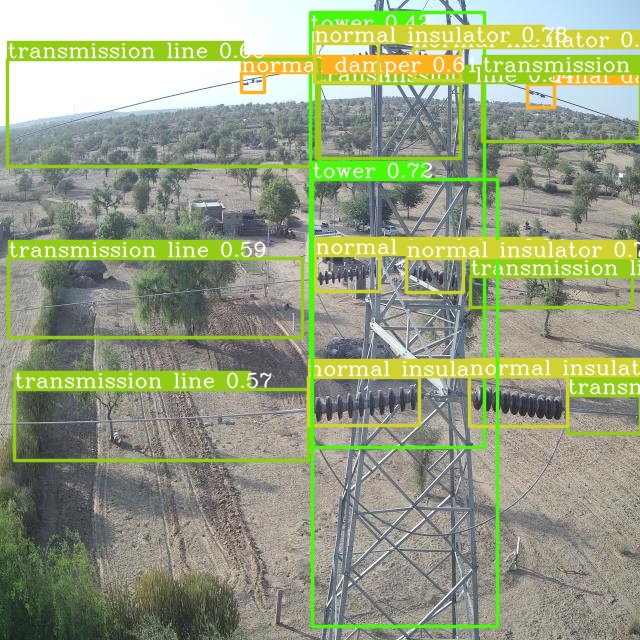

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0542_jpg.rf.73adc974b4a9f2c2cf144c213d97a174.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0546-2_jpg.rf.f2f5b8ee0f46e64ca79af4be080af9d9.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0546-2_jpg.rf.f2f5b8ee0f46e64ca79af4be080af9d9.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 19.34it/s]
Results saved to runs/inference/exp


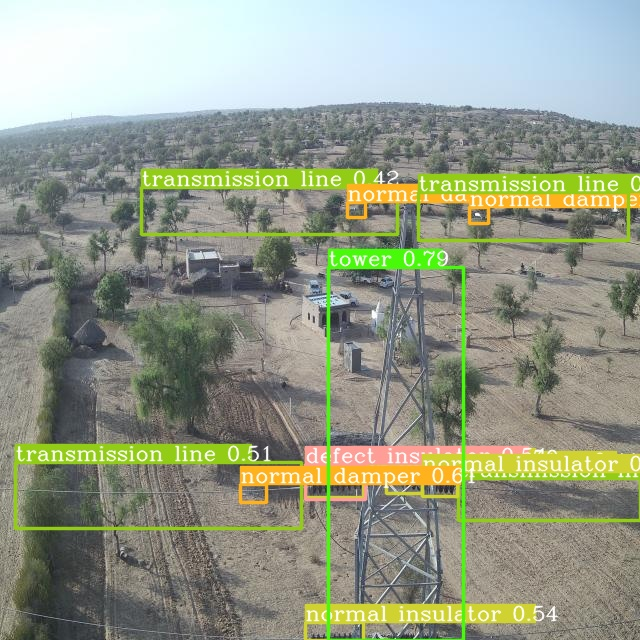

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0546-2_jpg.rf.f2f5b8ee0f46e64ca79af4be080af9d9.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
import cv2
import os
import random
label_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/labels'
raw_images_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/images'
save_images_folder = r'/content/YOLOv6/save_images_test'
name_list_path = r'/content/YOLOv6/Transmission-dataset-T53-4/labels/test'
classes_path = r'/content/YOLOv6/Transmission-dataset-T53-4'
image_name=r'./runs/inference/exp/DJI_0546-2_jpg.rf.f2f5b8ee0f46e64ca79af4be080af9d9.jpg'
label=name_of_class='defect damper'

def plot_one_box(x, image, color=None, label=name_of_class,line_thickness=None):

    tl = line_thickness or round(0.002 * (image.shape[0] + image.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(image, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label:
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(str(label), 0, fontScale=tl / 3,thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(image, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(image, str(label), (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
def draw_box_on_image(image_name, classes_path, label_folder, raw_images_folder, save_images_folder ):
    txt_path  = r"/content/YOLOv6/Transmission-dataset-T53-4/labels/test/DJI_0546-2_jpg.rf.f2f5b8ee0f46e64ca79af4be080af9d9.txt"
    print(image_name)
    if image_name == '.DS_Store':
        return 0
    image_path = r"./runs/inference/exp/DJI_0546-2_jpg.rf.f2f5b8ee0f46e64ca79af4be080af9d9.jpg"
    save_file_path = r"/content/YOLOv6/save_images_test/DJI_0546-2"
    source_file = open(txt_path) if os.path.exists(txt_path) else []
    image = cv2.imread(image_path)
    try:
        height, width, channels = image.shape
    except:
        print('no shape info.')
        return 0
    box_number = 0
    for line in source_file:
        staff = line.split()
        class_idx = int(staff[0])
        x_center, y_center, w, h = float(staff[1])*width, float(staff[2])*height, float(staff[3])*width, float(staff[4])*height
        x1 = round(x_center-w/2)
        y1 = round(y_center-h/2)
        x2 = round(x_center+w/2)
        y2 = round(y_center+h/2)
        plot_one_box([x1,y1,x2,y2], image,  label=name_of_class, line_thickness=None)
        cv2.imwrite(r"/content/YOLOv6/save_images_test/DJI_0546-2.jpg",image)
        box_number += 1
        return box_number
draw_box_on_image(image_name, classes_path,  label_folder, raw_images_folder, save_images_folder )





./runs/inference/exp/DJI_0546-2_jpg.rf.f2f5b8ee0f46e64ca79af4be080af9d9.jpg


1

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0550_jpg.rf.fe250bcf632b82113eb3c0de1e5d412e.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0550_jpg.rf.fe250bcf632b82113eb3c0de1e5d412e.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 17.01it/s]
Results saved to runs/inference/exp


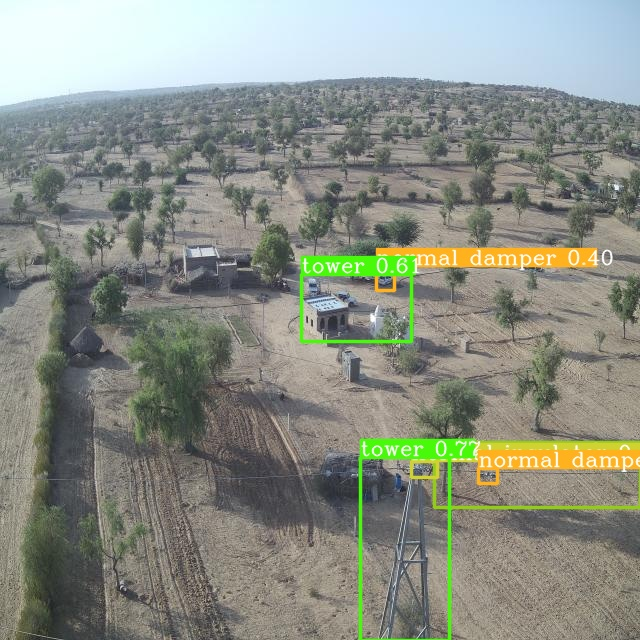

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0550_jpg.rf.fe250bcf632b82113eb3c0de1e5d412e.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0566-1_jpg.rf.d706cbbc03df0fb1e7b43435d955e3ed.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0566-1_jpg.rf.d706cbbc03df0fb1e7b43435d955e3ed.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 21.28it/s]
Results saved to runs/inference/exp


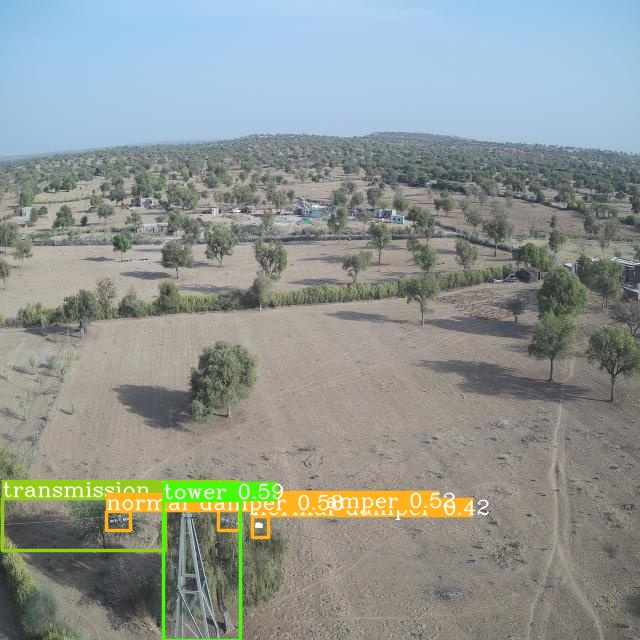

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0566-1_jpg.rf.d706cbbc03df0fb1e7b43435d955e3ed.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
import cv2
import os
import random
label_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/labels'
raw_images_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/images'
save_images_folder = r'/content/YOLOv6/save_images_test'
name_list_path = r'/content/YOLOv6/Transmission-dataset-T53-4/labels/test'
classes_path = r'/content/YOLOv6/Transmission-dataset-T53-4'
image_name=r'./runs/inference/exp/DJI_0566-1_jpg.rf.d706cbbc03df0fb1e7b43435d955e3ed.jpg'
label=name_of_class='defect transmission line'

def plot_one_box(x, image, color=None, label=name_of_class,line_thickness=None):

    tl = line_thickness or round(0.002 * (image.shape[0] + image.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(image, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label:
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(str(label), 0, fontScale=tl / 3,thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(image, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(image, str(label), (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
def draw_box_on_image(image_name, classes_path, label_folder, raw_images_folder, save_images_folder ):
    txt_path  = r"/content/YOLOv6/Transmission-dataset-T53-4/labels/test/DJI_0566-1_jpg.rf.d706cbbc03df0fb1e7b43435d955e3ed.txt"
    print(image_name)
    if image_name == '.DS_Store':
        return 0
    image_path = r"./runs/inference/exp/DJI_0566-1_jpg.rf.d706cbbc03df0fb1e7b43435d955e3ed.jpg"
    save_file_path = r"/content/YOLOv6/save_images_test/DJI_0566-1"
    source_file = open(txt_path) if os.path.exists(txt_path) else []
    image = cv2.imread(image_path)
    try:
        height, width, channels = image.shape
    except:
        print('no shape info.')
        return 0
    box_number = 0
    for line in source_file:
        staff = line.split()
        class_idx = int(staff[0])
        x_center, y_center, w, h = float(staff[1])*width, float(staff[2])*height, float(staff[3])*width, float(staff[4])*height
        x1 = round(x_center-w/2)
        y1 = round(y_center-h/2)
        x2 = round(x_center+w/2)
        y2 = round(y_center+h/2)
        plot_one_box([x1,y1,x2,y2], image,  label=name_of_class, line_thickness=None)
        cv2.imwrite(r"/content/YOLOv6/save_images_test/DJI_0566-1.jpg",image)
        box_number += 1
        return box_number
draw_box_on_image(image_name, classes_path,  label_folder, raw_images_folder, save_images_folder )





./runs/inference/exp/DJI_0566-1_jpg.rf.d706cbbc03df0fb1e7b43435d955e3ed.jpg


1

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0568_jpg.rf.0e11b2728b3ac27d3ba61d2551b2ef5d.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0568_jpg.rf.0e11b2728b3ac27d3ba61d2551b2ef5d.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 21.17it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0570-3_jpg.rf.40c1239819903a22ed58c4ee8e41f581.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0570-3_jpg.rf.40c1239819903a22ed58c4ee8e41f581.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 19.80it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0572-1_jpg.rf.f9361f78f72b0e10404c767514af876c.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0572-1_jpg.rf.f9361f78f72b0e10404c767514af876c.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 21.28it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0574-3_jpg.rf.cf27f9de44efc70223749918a2579c7b.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0574-3_jpg.rf.cf27f9de44efc70223749918a2579c7b.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 17.89it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0576-3_jpg.rf.3b82e7eca0336bed5da36c0720b6fec5.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0576-3_jpg.rf.3b82e7eca0336bed5da36c0720b6fec5.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 19.04it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0586_jpg.rf.15a2551408e0652aa83149705ad0dc09.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0586_jpg.rf.15a2551408e0652aa83149705ad0dc09.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 19.61it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0588-2_jpg.rf.34c86ac15dba651c8dd9d937c5ad64e8.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0588-2_jpg.rf.34c86ac15dba651c8dd9d937c5ad64e8.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 11.57it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0594_jpg.rf.cd82cec414afc4ab24efea8ef8e3da08.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0594_jpg.rf.cd82cec414afc4ab24efea8ef8e3da08.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 13.88it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0596_jpg.rf.aa6d822c54a5bb00c92dc3ae58bef16a.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0596_jpg.rf.aa6d822c54a5bb00c92dc3ae58bef16a.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 16.04it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0598-1_jpg.rf.7b881e533060ae52caf1d73c7bc1e028.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0598-1_jpg.rf.7b881e533060ae52caf1d73c7bc1e028.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 19.18it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0600-3_jpg.rf.620fce83e875227d5614c29ff1521d1a.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0600-3_jpg.rf.620fce83e875227d5614c29ff1521d1a.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 20.29it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0602_jpg.rf.44c5abb43600833159fe70477f4c0f40.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0602_jpg.rf.44c5abb43600833159fe70477f4c0f40.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 19.55it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0608_jpg.rf.dc52d1f246ce13ee9693d0ca73603532.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0608_jpg.rf.dc52d1f246ce13ee9693d0ca73603532.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 11.35it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0610-1_jpg.rf.6da56114fb89d36a6c94396a309355f8.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0610-1_jpg.rf.6da56114fb89d36a6c94396a309355f8.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 15.61it/s]
Results saved to runs/inference/exp


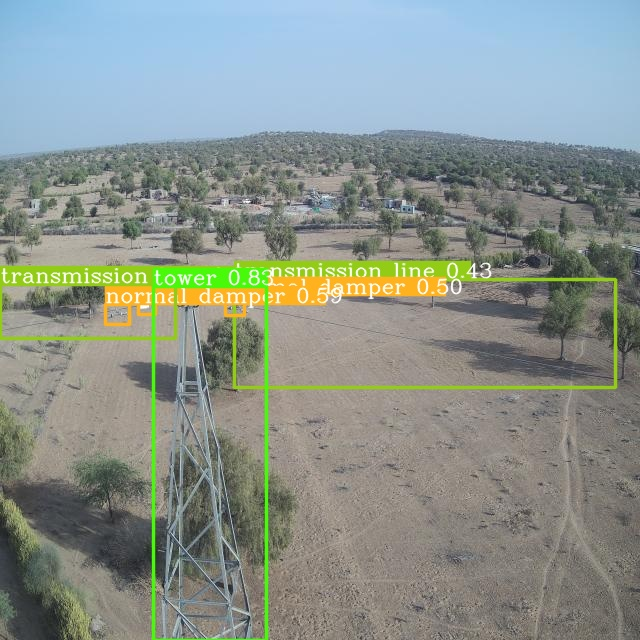

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0568_jpg.rf.0e11b2728b3ac27d3ba61d2551b2ef5d.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
import cv2
import os
import random
label_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/labels'
raw_images_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/images'
save_images_folder = r'/content/YOLOv6/save_images_test'
name_list_path = r'/content/YOLOv6/Transmission-dataset-T53-4/labels/test'
classes_path = r'/content/YOLOv6/Transmission-dataset-T53-4'
image_name=r'./runs/inference/exp/DJI_0568_jpg.rf.0e11b2728b3ac27d3ba61d2551b2ef5d.jpg'
label=name_of_class='defect transmission line'

def plot_one_box(x, image, color=None, label=name_of_class,line_thickness=None):

    tl = line_thickness or round(0.002 * (image.shape[0] + image.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(image, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label:
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(str(label), 0, fontScale=tl / 3,thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(image, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(image, str(label), (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
def draw_box_on_image(image_name, classes_path, label_folder, raw_images_folder, save_images_folder ):
    txt_path  = r"/content/YOLOv6/Transmission-dataset-T53-4/labels/test/DJI_0568_jpg.rf.0e11b2728b3ac27d3ba61d2551b2ef5d.txt"
    print(image_name)
    if image_name == '.DS_Store':
        return 0
    image_path = r"./runs/inference/exp/DJI_0568_jpg.rf.0e11b2728b3ac27d3ba61d2551b2ef5d.jpg"
    save_file_path = r"/content/YOLOv6/save_images_test/DJI_0568"
    source_file = open(txt_path) if os.path.exists(txt_path) else []
    image = cv2.imread(image_path)
    try:
        height, width, channels = image.shape
    except:
        print('no shape info.')
        return 0
    box_number = 0
    for line in source_file:
        staff = line.split()
        class_idx = int(staff[0])
        x_center, y_center, w, h = float(staff[1])*width, float(staff[2])*height, float(staff[3])*width, float(staff[4])*height
        x1 = round(x_center-w/2)
        y1 = round(y_center-h/2)
        x2 = round(x_center+w/2)
        y2 = round(y_center+h/2)
        plot_one_box([x1,y1,x2,y2], image,  label=name_of_class, line_thickness=None)
        cv2.imwrite(r"/content/YOLOv6/save_images_test/DJI_0568.jpg",image)
        box_number += 1
        return box_number
draw_box_on_image(image_name, classes_path,  label_folder, raw_images_folder, save_images_folder )





./runs/inference/exp/DJI_0568_jpg.rf.0e11b2728b3ac27d3ba61d2551b2ef5d.jpg


1

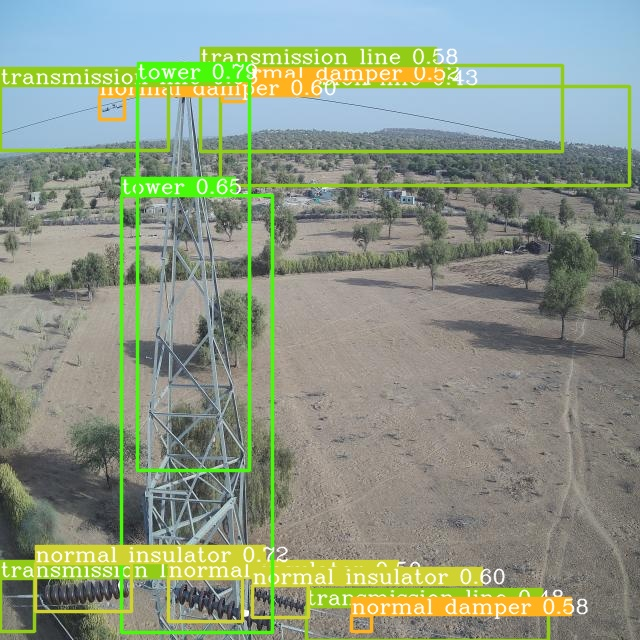

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0570-3_jpg.rf.40c1239819903a22ed58c4ee8e41f581.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
import cv2
import os
import random
label_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/labels'
raw_images_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/images'
save_images_folder = r'/content/YOLOv6/save_images_test'
name_list_path = r'/content/YOLOv6/Transmission-dataset-T53-4/labels/test'
classes_path = r'/content/YOLOv6/Transmission-dataset-T53-4'
image_name=r'./runs/inference/exp/DJI_0570-3_jpg.rf.40c1239819903a22ed58c4ee8e41f581.jpg'
label=name_of_class='defect insulator'

def plot_one_box(x, image, color=None, label=name_of_class,line_thickness=None):

    tl = line_thickness or round(0.002 * (image.shape[0] + image.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(image, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label:
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(str(label), 0, fontScale=tl / 3,thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(image, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(image, str(label), (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
def draw_box_on_image(image_name, classes_path, label_folder, raw_images_folder, save_images_folder ):
    txt_path  = r"/content/YOLOv6/Transmission-dataset-T53-4/labels/test/DJI_0570-3_jpg.rf.40c1239819903a22ed58c4ee8e41f581.txt"
    print(image_name)
    if image_name == '.DS_Store':
        return 0
    image_path = r"./runs/inference/exp/DJI_0570-3_jpg.rf.40c1239819903a22ed58c4ee8e41f581.jpg"
    save_file_path = r"/content/YOLOv6/save_images_test/DJI_0570-3"
    source_file = open(txt_path) if os.path.exists(txt_path) else []
    image = cv2.imread(image_path)
    try:
        height, width, channels = image.shape
    except:
        print('no shape info.')
        return 0
    box_number = 0
    for line in source_file:
        staff = line.split()
        class_idx = int(staff[0])
        x_center, y_center, w, h = float(staff[1])*width, float(staff[2])*height, float(staff[3])*width, float(staff[4])*height
        x1 = round(x_center-w/2)
        y1 = round(y_center-h/2)
        x2 = round(x_center+w/2)
        y2 = round(y_center+h/2)
        plot_one_box([x1,y1,x2,y2], image,  label=name_of_class, line_thickness=None)
        cv2.imwrite(r"/content/YOLOv6/save_images_test/DJI_0570-3.jpg",image)
        box_number += 1
        return box_number
draw_box_on_image(image_name, classes_path,  label_folder, raw_images_folder, save_images_folder )





./runs/inference/exp/DJI_0570-3_jpg.rf.40c1239819903a22ed58c4ee8e41f581.jpg


1

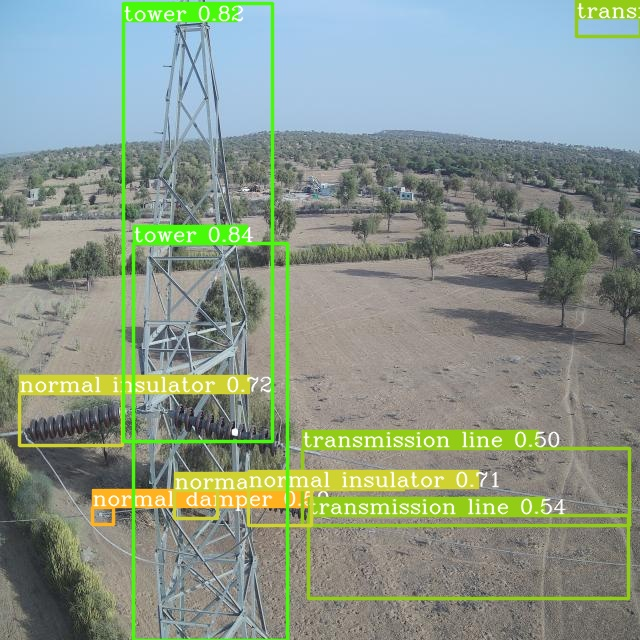

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0572-1_jpg.rf.f9361f78f72b0e10404c767514af876c.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
import cv2
import os
import random
label_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/labels'
raw_images_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/images'
save_images_folder = r'/content/YOLOv6/save_images_test'
name_list_path = r'/content/YOLOv6/Transmission-dataset-T53-4/labels/test'
classes_path = r'/content/YOLOv6/Transmission-dataset-T53-4'
image_name=r'./runs/inference/exp/DJI_0572-1_jpg.rf.f9361f78f72b0e10404c767514af876c.jpg'
label=name_of_class='defect insulator'

def plot_one_box(x, image, color=None, label=name_of_class,line_thickness=None):

    tl = line_thickness or round(0.002 * (image.shape[0] + image.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(image, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label:
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(str(label), 0, fontScale=tl / 3,thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(image, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(image, str(label), (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
def draw_box_on_image(image_name, classes_path, label_folder, raw_images_folder, save_images_folder ):
    txt_path  = r"/content/YOLOv6/Transmission-dataset-T53-4/labels/test/DJI_0572-1_jpg.rf.f9361f78f72b0e10404c767514af876c.txt"
    print(image_name)
    if image_name == '.DS_Store':
        return 0
    image_path = r"./runs/inference/exp/DJI_0572-1_jpg.rf.f9361f78f72b0e10404c767514af876c.jpg"
    save_file_path = r"/content/YOLOv6/save_images_test/DJI_0572-1"
    source_file = open(txt_path) if os.path.exists(txt_path) else []
    image = cv2.imread(image_path)
    try:
        height, width, channels = image.shape
    except:
        print('no shape info.')
        return 0
    box_number = 0
    for line in source_file:
        staff = line.split()
        class_idx = int(staff[0])
        x_center, y_center, w, h = float(staff[1])*width, float(staff[2])*height, float(staff[3])*width, float(staff[4])*height
        x1 = round(x_center-w/2)
        y1 = round(y_center-h/2)
        x2 = round(x_center+w/2)
        y2 = round(y_center+h/2)
        plot_one_box([x1,y1,x2,y2], image,  label=name_of_class, line_thickness=None)
        cv2.imwrite(r"/content/YOLOv6/save_images_test/DJI_0572-1.jpg",image)
        box_number += 1
        return box_number
draw_box_on_image(image_name, classes_path,  label_folder, raw_images_folder, save_images_folder )





./runs/inference/exp/DJI_0572-1_jpg.rf.f9361f78f72b0e10404c767514af876c.jpg


1

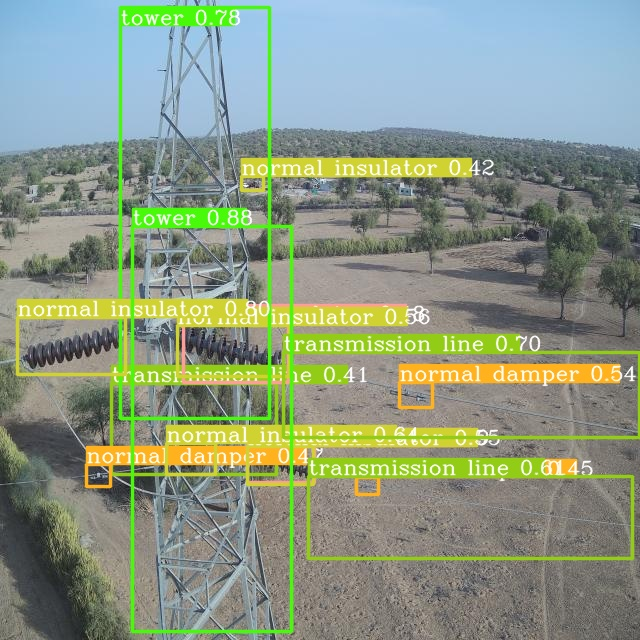

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0574-3_jpg.rf.cf27f9de44efc70223749918a2579c7b.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

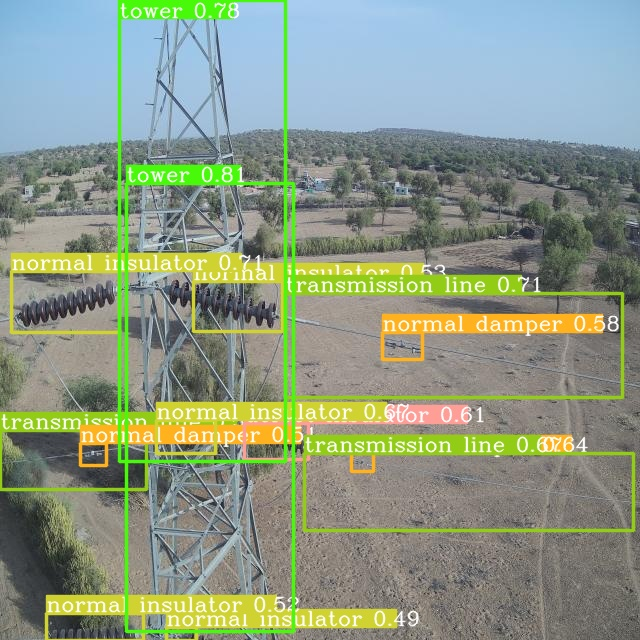

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0576-3_jpg.rf.3b82e7eca0336bed5da36c0720b6fec5.jpg'):#assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

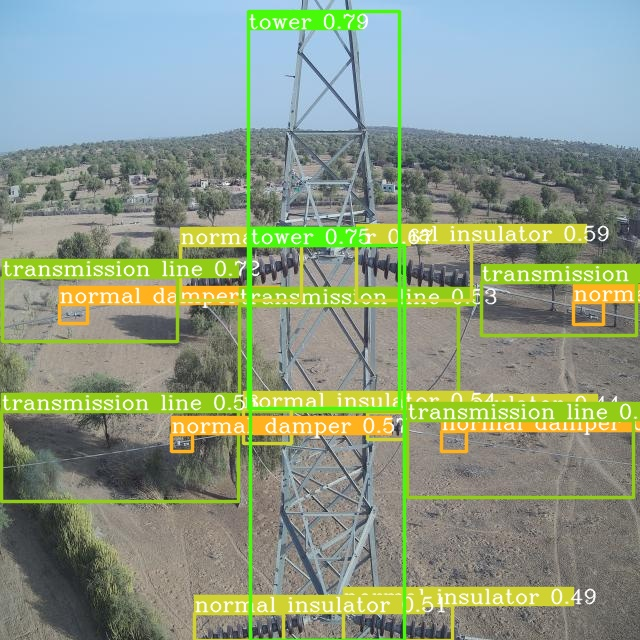

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0586_jpg.rf.15a2551408e0652aa83149705ad0dc09.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

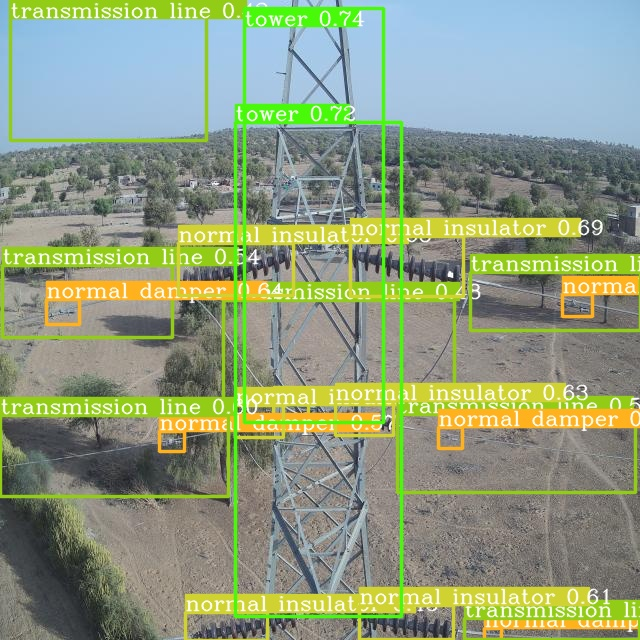

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0588-2_jpg.rf.34c86ac15dba651c8dd9d937c5ad64e8.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
import cv2
import os
import random
label_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/labels'
raw_images_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/images'
save_images_folder = r'/content/YOLOv6/save_images_test'
name_list_path = r'/content/YOLOv6/Transmission-dataset-T53-4/labels/test'
classes_path = r'/content/YOLOv6/Transmission-dataset-T53-4'
image_name=r'./runs/inference/exp/DJI_0588-2_jpg.rf.34c86ac15dba651c8dd9d937c5ad64e8.jpg'
label=name_of_class='defect insulator'

def plot_one_box(x, image, color=None, label=name_of_class,line_thickness=None):

    tl = line_thickness or round(0.002 * (image.shape[0] + image.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(image, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label:
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(str(label), 0, fontScale=tl / 3,thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(image, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(image, str(label), (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
def draw_box_on_image(image_name, classes_path, label_folder, raw_images_folder, save_images_folder ):
    txt_path  = r"/content/YOLOv6/Transmission-dataset-T53-4/labels/test/DJI_0588-2_jpg.rf.34c86ac15dba651c8dd9d937c5ad64e8.txt"
    print(image_name)
    if image_name == '.DS_Store':
        return 0
    image_path = r"./runs/inference/exp/DJI_0588-2_jpg.rf.34c86ac15dba651c8dd9d937c5ad64e8.jpg"
    save_file_path = r"/content/YOLOv6/save_images_test/DJI_0588-2"
    source_file = open(txt_path) if os.path.exists(txt_path) else []
    image = cv2.imread(image_path)
    try:
        height, width, channels = image.shape
    except:
        print('no shape info.')
        return 0
    box_number = 0
    for line in source_file:
        staff = line.split()
        class_idx = int(staff[0])
        x_center, y_center, w, h = float(staff[1])*width, float(staff[2])*height, float(staff[3])*width, float(staff[4])*height
        x1 = round(x_center-w/2)
        y1 = round(y_center-h/2)
        x2 = round(x_center+w/2)
        y2 = round(y_center+h/2)
        plot_one_box([x1,y1,x2,y2], image,  label=name_of_class, line_thickness=None)
        cv2.imwrite(r"/content/YOLOv6/save_images_test/DJI_0588-2.jpg",image)
        box_number += 1
        return box_number
draw_box_on_image(image_name, classes_path,  label_folder, raw_images_folder, save_images_folder )





./runs/inference/exp/DJI_0588-2_jpg.rf.34c86ac15dba651c8dd9d937c5ad64e8.jpg


1

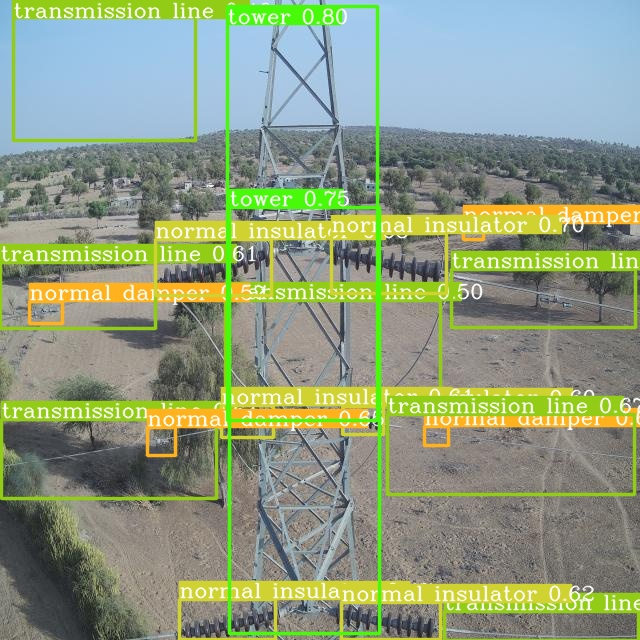

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0594_jpg.rf.cd82cec414afc4ab24efea8ef8e3da08.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

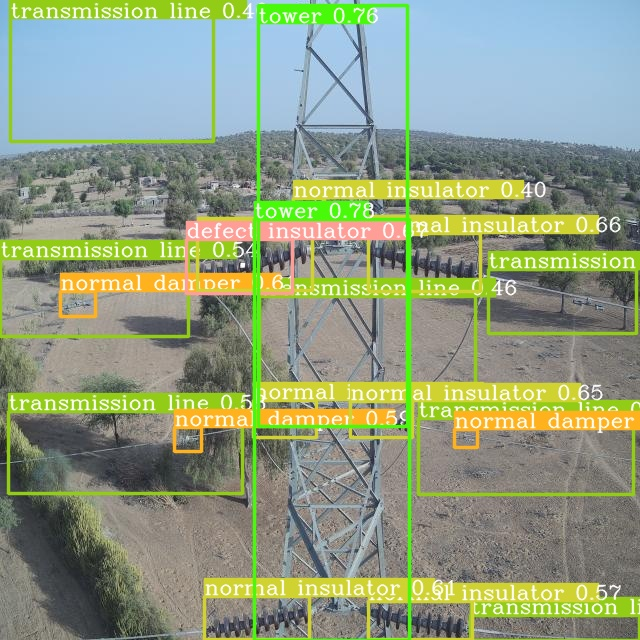

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0596_jpg.rf.aa6d822c54a5bb00c92dc3ae58bef16a.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

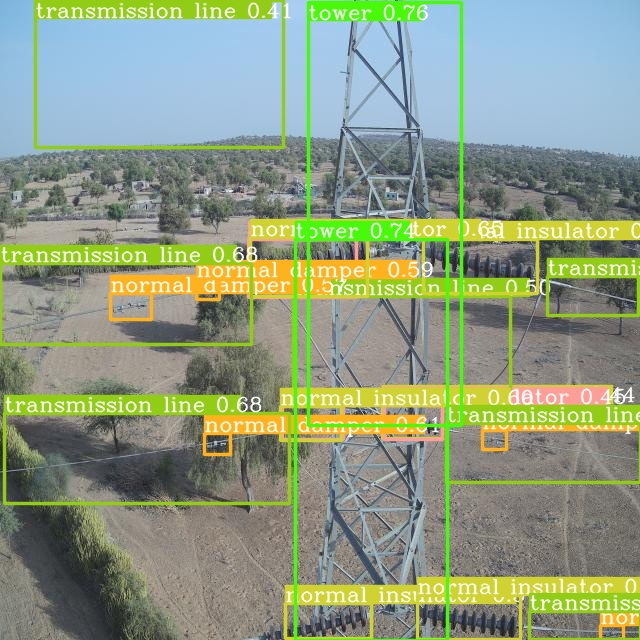

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0598-1_jpg.rf.7b881e533060ae52caf1d73c7bc1e028.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

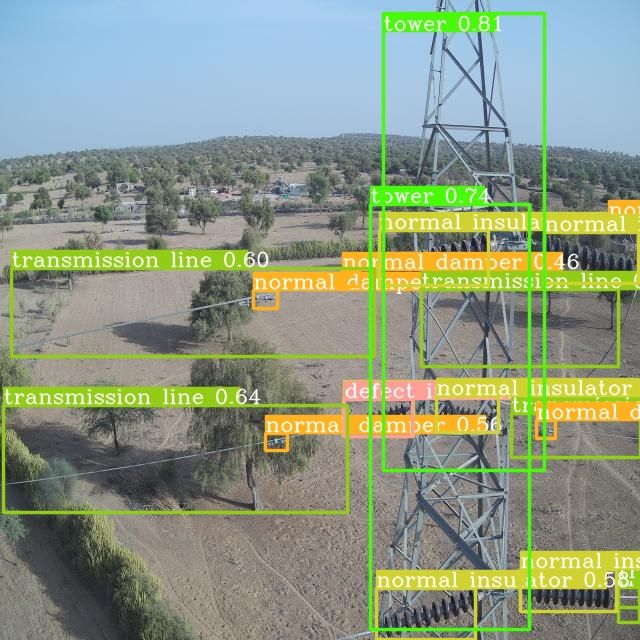

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0600-3_jpg.rf.620fce83e875227d5614c29ff1521d1a.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

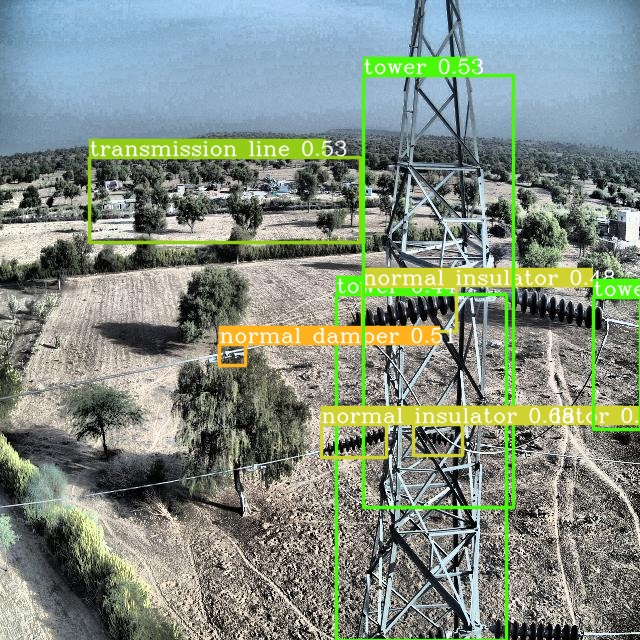

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0602_jpg.rf.44c5abb43600833159fe70477f4c0f40.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

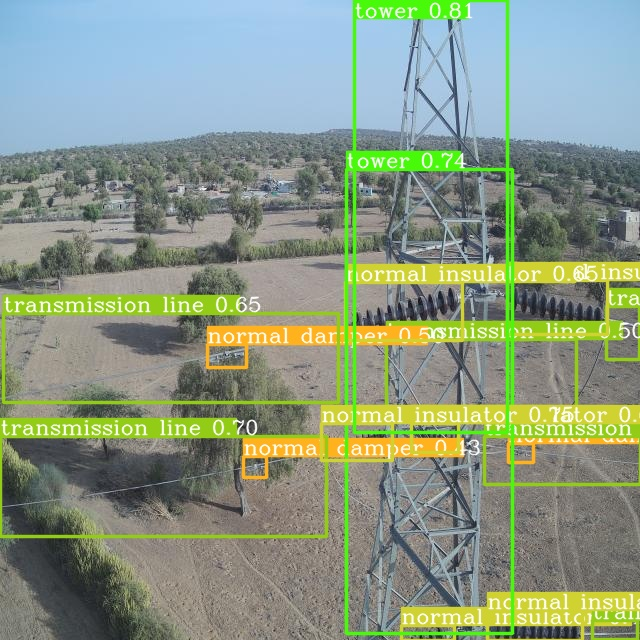

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0608_jpg.rf.dc52d1f246ce13ee9693d0ca73603532.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

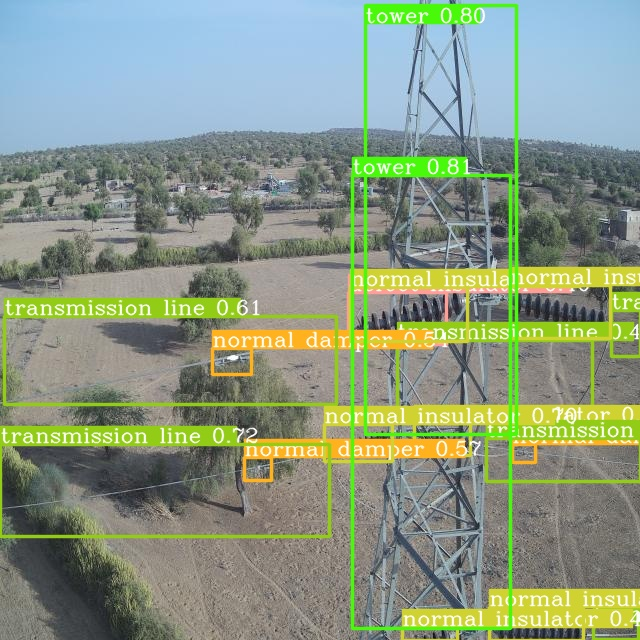

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0610-1_jpg.rf.6da56114fb89d36a6c94396a309355f8.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
import cv2
import os
import random
label_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/labels'
raw_images_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/images'
save_images_folder = r'/content/YOLOv6/save_images_test'
name_list_path = r'/content/YOLOv6/Transmission-dataset-T53-4/labels/test'
classes_path = r'/content/YOLOv6/Transmission-dataset-T53-4'
image_name=r'./runs/inference/exp/DJI_0610-1_jpg.rf.6da56114fb89d36a6c94396a309355f8.jpg'
label=name_of_class='defect damper'

def plot_one_box(x, image, color=None, label=name_of_class,line_thickness=None):

    tl = line_thickness or round(0.002 * (image.shape[0] + image.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(image, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label:
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(str(label), 0, fontScale=tl / 3,thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(image, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(image, str(label), (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
def draw_box_on_image(image_name, classes_path, label_folder, raw_images_folder, save_images_folder ):
    txt_path  = r"/content/YOLOv6/Transmission-dataset-T53-4/labels/test/DJI_0610-1_jpg.rf.6da56114fb89d36a6c94396a309355f8.txt"
    print(image_name)
    if image_name == '.DS_Store':
        return 0
    image_path = r"./runs/inference/exp/DJI_0610-1_jpg.rf.6da56114fb89d36a6c94396a309355f8.jpg"
    save_file_path = r"/content/YOLOv6/save_images_test/DJI_0610-1"
    source_file = open(txt_path) if os.path.exists(txt_path) else []
    image = cv2.imread(image_path)
    try:
        height, width, channels = image.shape
    except:
        print('no shape info.')
        return 0
    box_number = 0
    for line in source_file:
        staff = line.split()
        class_idx = int(staff[0])
        x_center, y_center, w, h = float(staff[1])*width, float(staff[2])*height, float(staff[3])*width, float(staff[4])*height
        x1 = round(x_center-w/2)
        y1 = round(y_center-h/2)
        x2 = round(x_center+w/2)
        y2 = round(y_center+h/2)
        plot_one_box([x1,y1,x2,y2], image,  label=name_of_class, line_thickness=None)
        cv2.imwrite(r"/content/YOLOv6/save_images_test/DJI_0610-1.jpg",image)
        box_number += 1
        return box_number
draw_box_on_image(image_name, classes_path,  label_folder, raw_images_folder, save_images_folder )





./runs/inference/exp/DJI_0610-1_jpg.rf.6da56114fb89d36a6c94396a309355f8.jpg


1

In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0610-2_jpg.rf.3e4d1178c2ecd4803f32d4a8645a6a5d.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0610-2_jpg.rf.3e4d1178c2ecd4803f32d4a8645a6a5d.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 19.51it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0610_jpg.rf.e2e1c8538ad0f94f329c1bc0d2331340.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0610_jpg.rf.e2e1c8538ad0f94f329c1bc0d2331340.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 18.79it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0612_jpg.rf.60fd26f7f1e4015b6017e094830f1a7a.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0612_jpg.rf.60fd26f7f1e4015b6017e094830f1a7a.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 20.30it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0614-2_jpg.rf.207958fe80436e2ed2c57fa7fb4cdc9c.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0614-2_jpg.rf.207958fe80436e2ed2c57fa7fb4cdc9c.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 19.17it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0616_jpg.rf.a800f2d97fa2e6dd0532575c9ac02342.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0616_jpg.rf.a800f2d97fa2e6dd0532575c9ac02342.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 20.43it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0634-1_jpg.rf.402b3eb226a88a408936a60d729a1b68.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0634-1_jpg.rf.402b3eb226a88a408936a60d729a1b68.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 18.99it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0640_jpg.rf.b3b9ab079c905996e9354963d0abc145.jpg   --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0640_jpg.rf.b3b9ab079c905996e9354963d0abc145.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 19.99it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0648_jpg.rf.61d0e8732fb4f7d3a469a03fb800cf08.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0648_jpg.rf.61d0e8732fb4f7d3a469a03fb800cf08.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 20.16it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0652_jpg.rf.53ee40750b5a6b3e40f4f0d0eb3d4763.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0652_jpg.rf.53ee40750b5a6b3e40f4f0d0eb3d4763.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 20.22it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0658-1_jpg.rf.2c3a2ae36873ec952a723cac9043bbe0.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0658-1_jpg.rf.2c3a2ae36873ec952a723cac9043bbe0.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 16.97it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0668-2_jpg.rf.2c56671503d05a180ae05dc9bc4ed465.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0668-2_jpg.rf.2c56671503d05a180ae05dc9bc4ed465.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 19.12it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0670-3_jpg.rf.22d597a02ffa7c4170a83eb43b1016b4.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0670-3_jpg.rf.22d597a02ffa7c4170a83eb43b1016b4.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 20.24it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0680_jpg.rf.ee00eebfaffe43ca94ae24b5127c95fb.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0680_jpg.rf.ee00eebfaffe43ca94ae24b5127c95fb.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 20.39it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0694_jpg.rf.46cf791d77cbc18d0aca1ba0875ac0af.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0694_jpg.rf.46cf791d77cbc18d0aca1ba0875ac0af.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 17.54it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0732_jpg.rf.d74ae26522b4c065e484187068b69baf.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0732_jpg.rf.d74ae26522b4c065e484187068b69baf.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 10.92it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0740_jpg.rf.ecf1f6464e62cba17373af85165cc04a.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0740_jpg.rf.ecf1f6464e62cba17373af85165cc04a.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 20.54it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0744_jpg.rf.9abee5b5821793b2d579862be7ca1611.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0744_jpg.rf.9abee5b5821793b2d579862be7ca1611.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0746_jpg.rf.b726b87665792a17a6daa4fb22fdd654.jpg  --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0746_jpg.rf.b726b87665792a17a6daa4fb22fdd654.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 16.18it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0752_jpg.rf.8b16dc2c19d35b5b14c4f15043a1e4dd.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0752_jpg.rf.8b16dc2c19d35b5b14c4f15043a1e4dd.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 20.46it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0790_jpg.rf.3d4ceebbe4f67bacb93115193c8c7162.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0790_jpg.rf.3d4ceebbe4f67bacb93115193c8c7162.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 20.83it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0800_jpg.rf.439fcdd8ca8732aae4a723510df265cb.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0800_jpg.rf.439fcdd8ca8732aae4a723510df265cb.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 21.17it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0802-1_jpg.rf.edc9a64d045ee8a0bd359c516be76fc7.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0802-1_jpg.rf.edc9a64d045ee8a0bd359c516be76fc7.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 19.97it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0808_jpg.rf.d3d73608bc4a54d27a4dffa709ce0aee.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0808_jpg.rf.d3d73608bc4a54d27a4dffa709ce0aee.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 19.27it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0820-1_jpg.rf.cecf223ab55473d3e6f13527ea6ba5c9.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0820-1_jpg.rf.cecf223ab55473d3e6f13527ea6ba5c9.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 19.67it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0838-1_jpg.rf.7b5ef90a9742ff383601b901709dd596.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0838-1_jpg.rf.7b5ef90a9742ff383601b901709dd596.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 19.00it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0840_jpg.rf.fa25e8db1201a15e89c32e3b30060c2a.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0840_jpg.rf.fa25e8db1201a15e89c32e3b30060c2a.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 18.68it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0846_jpg.rf.8563fcd764eff983e829afa2be07fdd8.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0846_jpg.rf.8563fcd764eff983e829afa2be07fdd8.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 15.21it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0874_jpg.rf.2ba40dc06c4f25ac4d1ca256a0593e0f.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0874_jpg.rf.2ba40dc06c4f25ac4d1ca256a0593e0f.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 19.48it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0916_jpg.rf.292a95814df825b988605ff328884cb4.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0916_jpg.rf.292a95814df825b988605ff328884cb4.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 16.78it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0940_jpg.rf.36950fe4028353326282ed9fc2ff4d89.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0940_jpg.rf.36950fe4028353326282ed9fc2ff4d89.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 19.81it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0950_jpg.rf.4e4eb8c15ba096af572b98b320804b3d.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0950_jpg.rf.4e4eb8c15ba096af572b98b320804b3d.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 19.87it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0954-1_jpg.rf.65eb9b5e1961c5fe15aaf85dd36a2c34.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0954-1_jpg.rf.65eb9b5e1961c5fe15aaf85dd36a2c34.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 19.93it/s]
Results saved to runs/inference/exp


In [ ]:
!python tools/infer.py --yaml {dataset.location}/data.yaml  --weights runs/train/exp/weights/best_ckpt.pt --source {dataset.location}/images/test/DJI_0960_jpg.rf.405ee7a4cf77ed7d5e4143db085b1353.jpg --device 0

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='/content/YOLOv6/Transmission-dataset-T53-4/images/test/DJI_0960_jpg.rf.405ee7a4cf77ed7d5e4143db085b1353.jpg', webcam=False, webcam_addr='0', yaml='/content/YOLOv6/Transmission-dataset-T53-4/data.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
100% 1/1 [00:00<00:00, 20.99it/s]
Results saved to runs/inference/exp


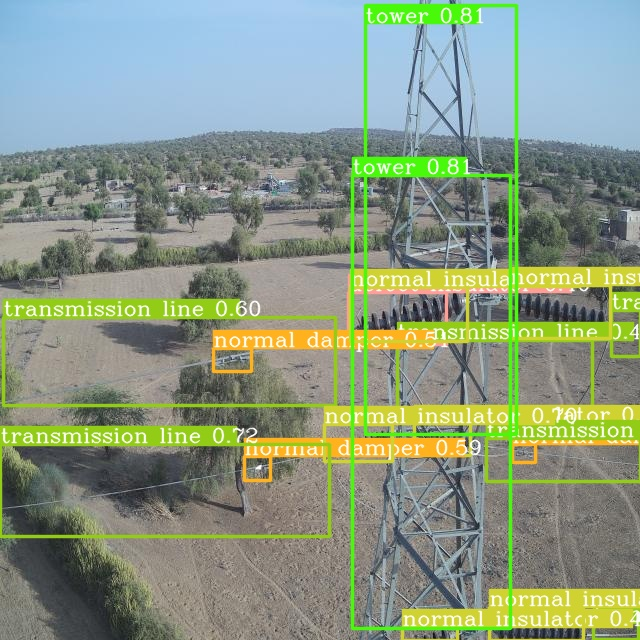

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0610-2_jpg.rf.3e4d1178c2ecd4803f32d4a8645a6a5d.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
import cv2
import os
import random
label_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/labels'
raw_images_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/images'
save_images_folder = r'/content/YOLOv6/save_images_test'
name_list_path = r'/content/YOLOv6/Transmission-dataset-T53-4/labels/test'
classes_path = r'/content/YOLOv6/Transmission-dataset-T53-4'
image_name=r'./runs/inference/exp/DJI_0610-2_jpg.rf.3e4d1178c2ecd4803f32d4a8645a6a5d.jpg'
label=name_of_class='defect damper'

def plot_one_box(x, image, color=None, label=name_of_class,line_thickness=None):

    tl = line_thickness or round(0.002 * (image.shape[0] + image.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(image, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label:
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(str(label), 0, fontScale=tl / 3,thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(image, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(image, str(label), (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
def draw_box_on_image(image_name, classes_path, label_folder, raw_images_folder, save_images_folder ):
    txt_path  = r"/content/YOLOv6/Transmission-dataset-T53-4/labels/test/DJI_0610-2_jpg.rf.3e4d1178c2ecd4803f32d4a8645a6a5d.txt"
    print(image_name)
    if image_name == '.DS_Store':
        return 0
    image_path = r"./runs/inference/exp/DJI_0610-2_jpg.rf.3e4d1178c2ecd4803f32d4a8645a6a5d.jpg"
    save_file_path = r"/content/YOLOv6/save_images_test/DJI_0610-2"
    source_file = open(txt_path) if os.path.exists(txt_path) else []
    image = cv2.imread(image_path)
    try:
        height, width, channels = image.shape
    except:
        print('no shape info.')
        return 0
    box_number = 0
    for line in source_file:
        staff = line.split()
        class_idx = int(staff[0])
        x_center, y_center, w, h = float(staff[1])*width, float(staff[2])*height, float(staff[3])*width, float(staff[4])*height
        x1 = round(x_center-w/2)
        y1 = round(y_center-h/2)
        x2 = round(x_center+w/2)
        y2 = round(y_center+h/2)
        plot_one_box([x1,y1,x2,y2], image,  label=name_of_class, line_thickness=None)
        cv2.imwrite(r"/content/YOLOv6/save_images_test/DJI_0610-2.jpg",image)
        box_number += 1
        return box_number
draw_box_on_image(image_name, classes_path,  label_folder, raw_images_folder, save_images_folder )





./runs/inference/exp/DJI_0610-2_jpg.rf.3e4d1178c2ecd4803f32d4a8645a6a5d.jpg


1

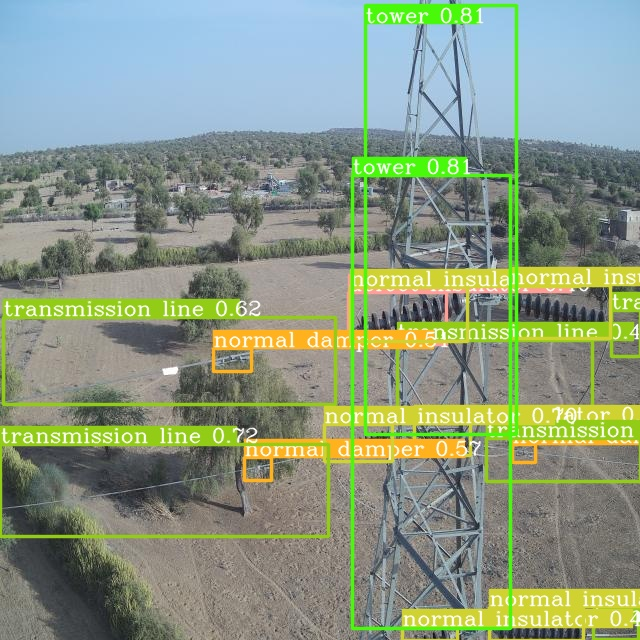

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0610_jpg.rf.e2e1c8538ad0f94f329c1bc0d2331340.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
import cv2
import os
import random
label_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/labels'
raw_images_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/images'
save_images_folder = r'/content/YOLOv6/save_images_test'
name_list_path = r'/content/YOLOv6/Transmission-dataset-T53-4/labels/test'
classes_path = r'/content/YOLOv6/Transmission-dataset-T53-4'
image_name=r'./runs/inference/exp/DJI_0610_jpg.rf.e2e1c8538ad0f94f329c1bc0d2331340.jpg'
label=name_of_class='defect transmission line'

def plot_one_box(x, image, color=None, label=name_of_class,line_thickness=None):

    tl = line_thickness or round(0.002 * (image.shape[0] + image.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(image, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label:
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(str(label), 0, fontScale=tl / 3,thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(image, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(image, str(label), (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
def draw_box_on_image(image_name, classes_path, label_folder, raw_images_folder, save_images_folder ):
    txt_path  = r"/content/YOLOv6/Transmission-dataset-T53-4/labels/test/DJI_0610_jpg.rf.e2e1c8538ad0f94f329c1bc0d2331340.txt"
    print(image_name)
    if image_name == '.DS_Store':
        return 0
    image_path = r"./runs/inference/exp/DJI_0610_jpg.rf.e2e1c8538ad0f94f329c1bc0d2331340.jpg"
    save_file_path = r"/content/YOLOv6/save_images_test/DJI_0610"
    source_file = open(txt_path) if os.path.exists(txt_path) else []
    image = cv2.imread(image_path)
    try:
        height, width, channels = image.shape
    except:
        print('no shape info.')
        return 0
    box_number = 0
    for line in source_file:
        staff = line.split()
        class_idx = int(staff[0])
        x_center, y_center, w, h = float(staff[1])*width, float(staff[2])*height, float(staff[3])*width, float(staff[4])*height
        x1 = round(x_center-w/2)
        y1 = round(y_center-h/2)
        x2 = round(x_center+w/2)
        y2 = round(y_center+h/2)
        plot_one_box([x1,y1,x2,y2], image,  label=name_of_class, line_thickness=None)
        cv2.imwrite(r"/content/YOLOv6/save_images_test/DJI_0610.jpg",image)
        box_number += 1
        return box_number
draw_box_on_image(image_name, classes_path,  label_folder, raw_images_folder, save_images_folder )





./runs/inference/exp/DJI_0610_jpg.rf.e2e1c8538ad0f94f329c1bc0d2331340.jpg


1

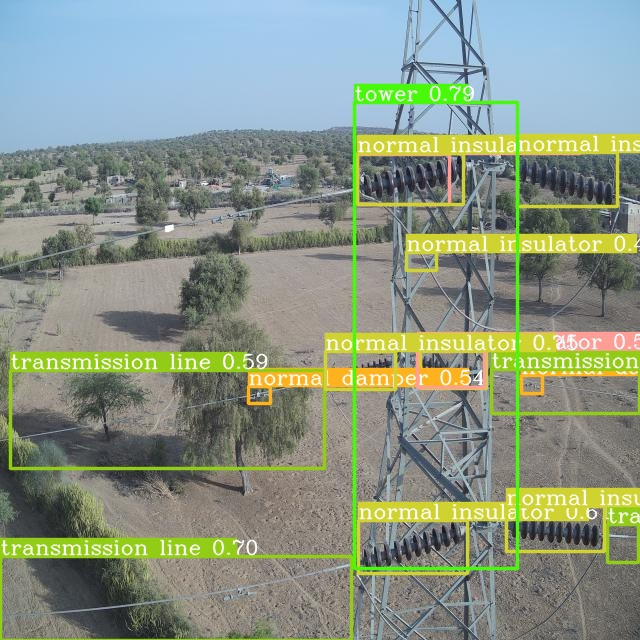

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0612_jpg.rf.60fd26f7f1e4015b6017e094830f1a7a.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
import cv2
import os
import random
label_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/labels'
raw_images_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/images'
save_images_folder = r'/content/YOLOv6/save_images_test'
name_list_path = r'/content/YOLOv6/Transmission-dataset-T53-4/labels/test'
classes_path = r'/content/YOLOv6/Transmission-dataset-T53-4'
image_name=r'./runs/inference/exp/DJI_0612_jpg.rf.60fd26f7f1e4015b6017e094830f1a7a.jpg'
label=name_of_class='defect transmission line'

def plot_one_box(x, image, color=None, label=name_of_class,line_thickness=None):

    tl = line_thickness or round(0.002 * (image.shape[0] + image.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(image, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label:
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(str(label), 0, fontScale=tl / 3,thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(image, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(image, str(label), (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
def draw_box_on_image(image_name, classes_path, label_folder, raw_images_folder, save_images_folder ):
    txt_path  = r"/content/YOLOv6/Transmission-dataset-T53-4/labels/test/DJI_0612_jpg.rf.60fd26f7f1e4015b6017e094830f1a7a.txt"
    print(image_name)
    if image_name == '.DS_Store':
        return 0
    image_path = r"./runs/inference/exp/DJI_0612_jpg.rf.60fd26f7f1e4015b6017e094830f1a7a.jpg"
    save_file_path = r"/content/YOLOv6/save_images_test/DJI_0612"
    source_file = open(txt_path) if os.path.exists(txt_path) else []
    image = cv2.imread(image_path)
    try:
        height, width, channels = image.shape
    except:
        print('no shape info.')
        return 0
    box_number = 0
    for line in source_file:
        staff = line.split()
        class_idx = int(staff[0])
        x_center, y_center, w, h = float(staff[1])*width, float(staff[2])*height, float(staff[3])*width, float(staff[4])*height
        x1 = round(x_center-w/2)
        y1 = round(y_center-h/2)
        x2 = round(x_center+w/2)
        y2 = round(y_center+h/2)
        plot_one_box([x1,y1,x2,y2], image,  label=name_of_class, line_thickness=None)
        cv2.imwrite(r"/content/YOLOv6/save_images_test/DJI_0612.jpg",image)
        box_number += 1
        return box_number
draw_box_on_image(image_name, classes_path,  label_folder, raw_images_folder, save_images_folder )





./runs/inference/exp/DJI_0612_jpg.rf.60fd26f7f1e4015b6017e094830f1a7a.jpg


1

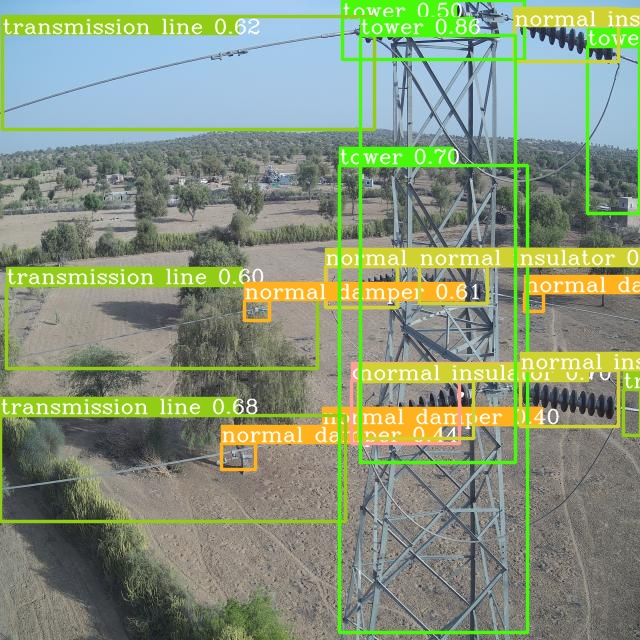

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0614-2_jpg.rf.207958fe80436e2ed2c57fa7fb4cdc9c.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

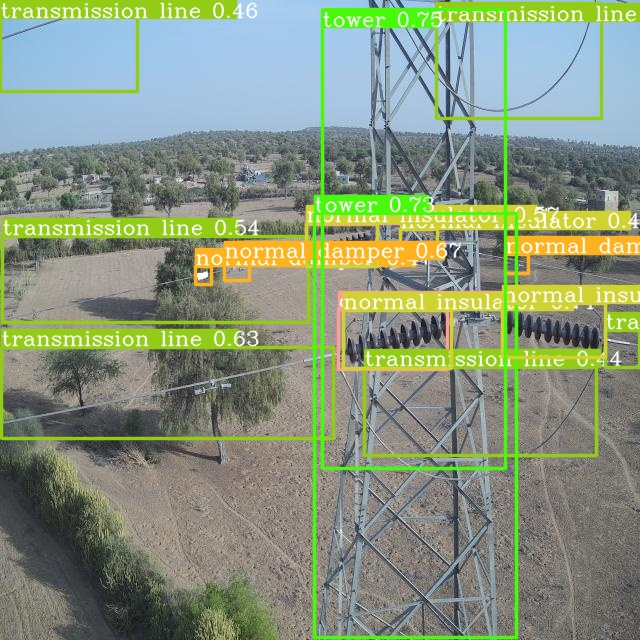

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0616_jpg.rf.a800f2d97fa2e6dd0532575c9ac02342.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
import cv2
import os
import random
label_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/labels'
raw_images_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/images'
save_images_folder = r'/content/YOLOv6/save_images_test'
name_list_path = r'/content/YOLOv6/Transmission-dataset-T53-4/labels/test'
classes_path = r'/content/YOLOv6/Transmission-dataset-T53-4'
image_name=r'./runs/inference/exp/DJI_0616_jpg.rf.a800f2d97fa2e6dd0532575c9ac02342.jpg'
label=name_of_class='defect transmission line'

def plot_one_box(x, image, color=None, label=name_of_class,line_thickness=None):

    tl = line_thickness or round(0.002 * (image.shape[0] + image.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(image, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label:
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(str(label), 0, fontScale=tl / 3,thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(image, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(image, str(label), (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
def draw_box_on_image(image_name, classes_path, label_folder, raw_images_folder, save_images_folder ):
    txt_path  = r"/content/YOLOv6/Transmission-dataset-T53-4/labels/test/DJI_0616_jpg.rf.a800f2d97fa2e6dd0532575c9ac02342.txt"
    print(image_name)
    if image_name == '.DS_Store':
        return 0
    image_path = r"./runs/inference/exp/DJI_0616_jpg.rf.a800f2d97fa2e6dd0532575c9ac02342.jpg"
    save_file_path = r"/content/YOLOv6/save_images_test/DJI_0616"
    source_file = open(txt_path) if os.path.exists(txt_path) else []
    image = cv2.imread(image_path)
    try:
        height, width, channels = image.shape
    except:
        print('no shape info.')
        return 0
    box_number = 0
    for line in source_file:
        staff = line.split()
        class_idx = int(staff[0])
        x_center, y_center, w, h = float(staff[1])*width, float(staff[2])*height, float(staff[3])*width, float(staff[4])*height
        x1 = round(x_center-w/2)
        y1 = round(y_center-h/2)
        x2 = round(x_center+w/2)
        y2 = round(y_center+h/2)
        plot_one_box([x1,y1,x2,y2], image,  label=name_of_class, line_thickness=None)
        cv2.imwrite(r"/content/YOLOv6/save_images_test/DJI_0616.jpg",image)
        box_number += 1
        return box_number
draw_box_on_image(image_name, classes_path,  label_folder, raw_images_folder, save_images_folder )





./runs/inference/exp/DJI_0616_jpg.rf.a800f2d97fa2e6dd0532575c9ac02342.jpg


1

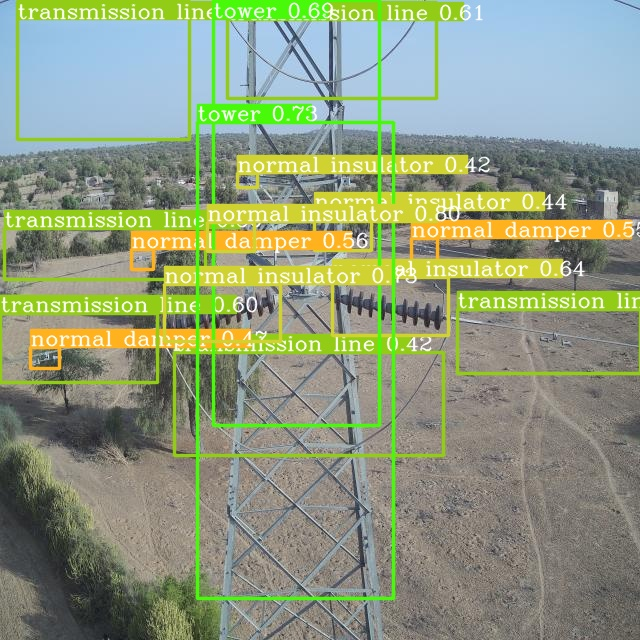

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0634-1_jpg.rf.402b3eb226a88a408936a60d729a1b68.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

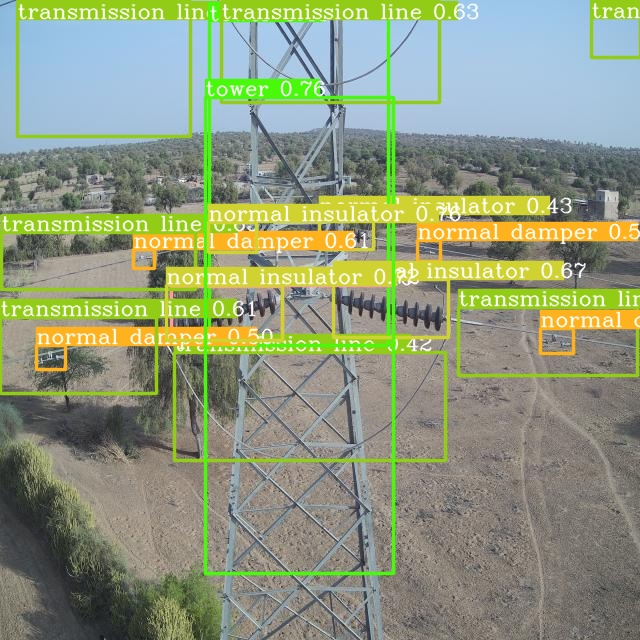

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0640_jpg.rf.b3b9ab079c905996e9354963d0abc145.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

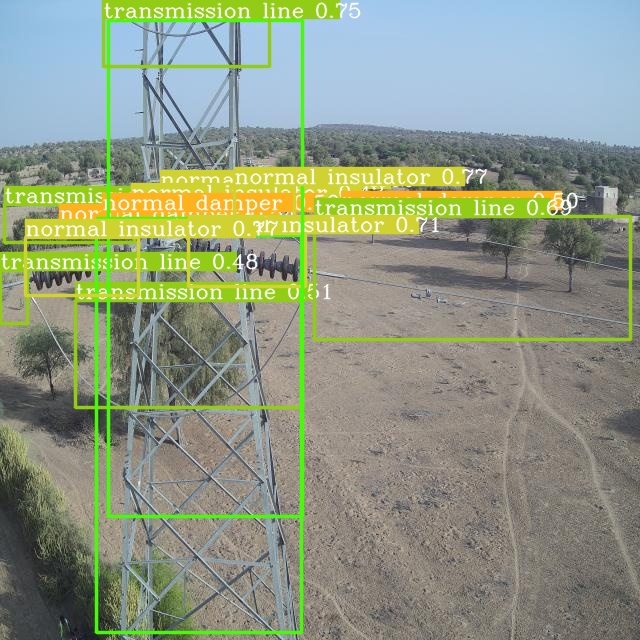

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0648_jpg.rf.61d0e8732fb4f7d3a469a03fb800cf08.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

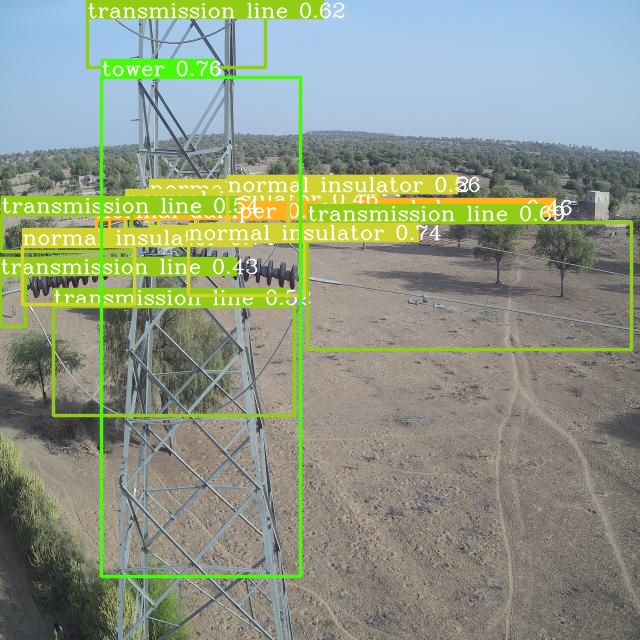

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0652_jpg.rf.53ee40750b5a6b3e40f4f0d0eb3d4763.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

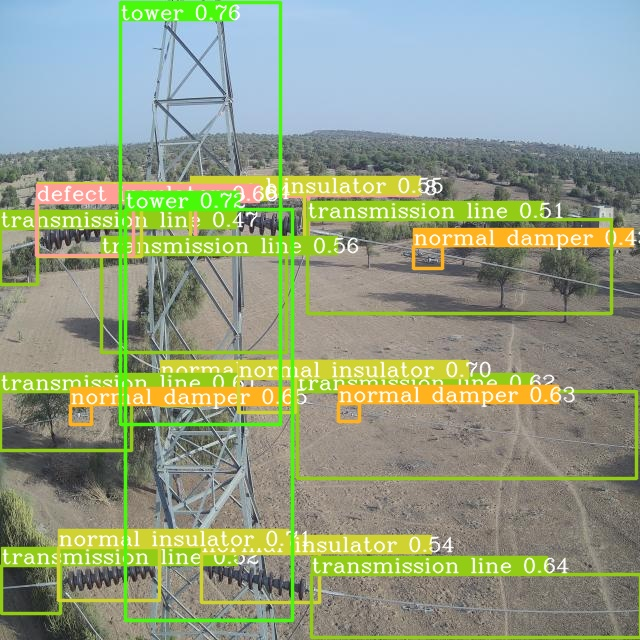

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0658-1_jpg.rf.2c3a2ae36873ec952a723cac9043bbe0.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

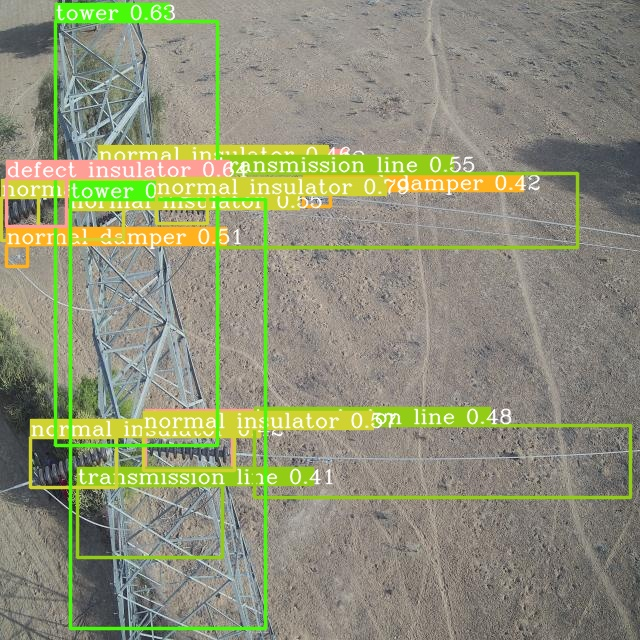

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0668-2_jpg.rf.2c56671503d05a180ae05dc9bc4ed465.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

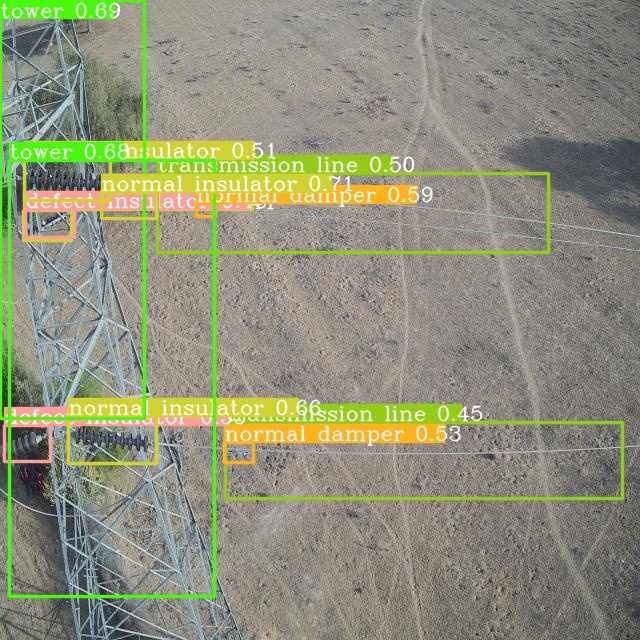

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0670-3_jpg.rf.22d597a02ffa7c4170a83eb43b1016b4.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

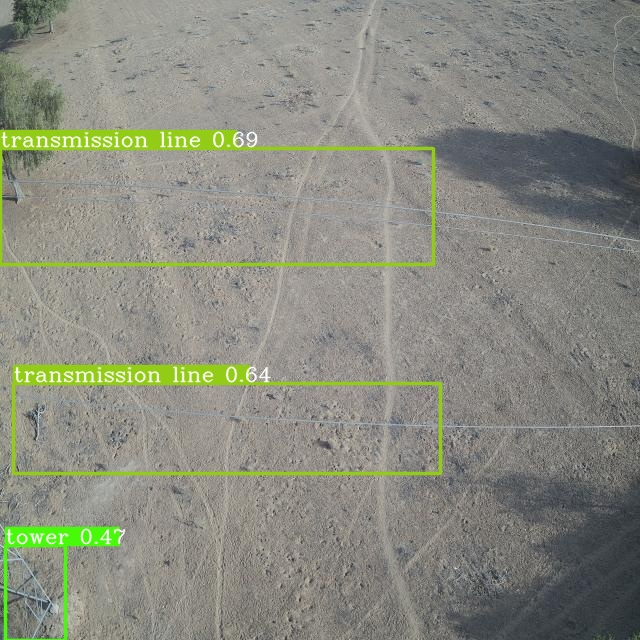

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0680_jpg.rf.ee00eebfaffe43ca94ae24b5127c95fb.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

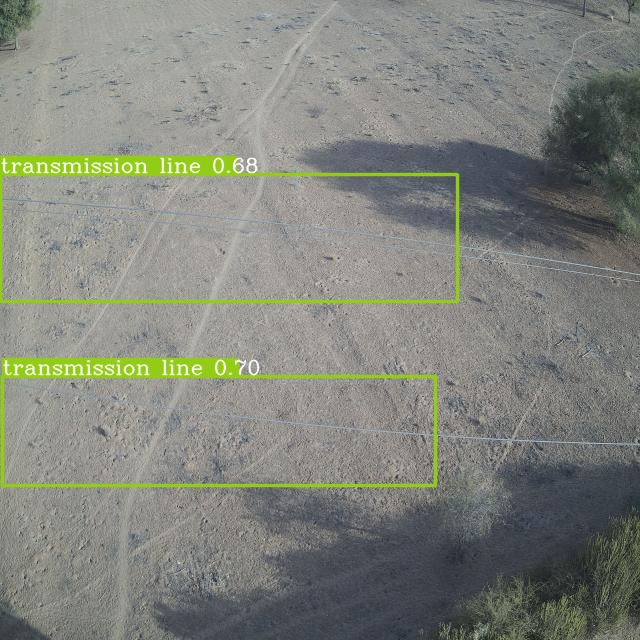

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0694_jpg.rf.46cf791d77cbc18d0aca1ba0875ac0af.jpg'):#assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

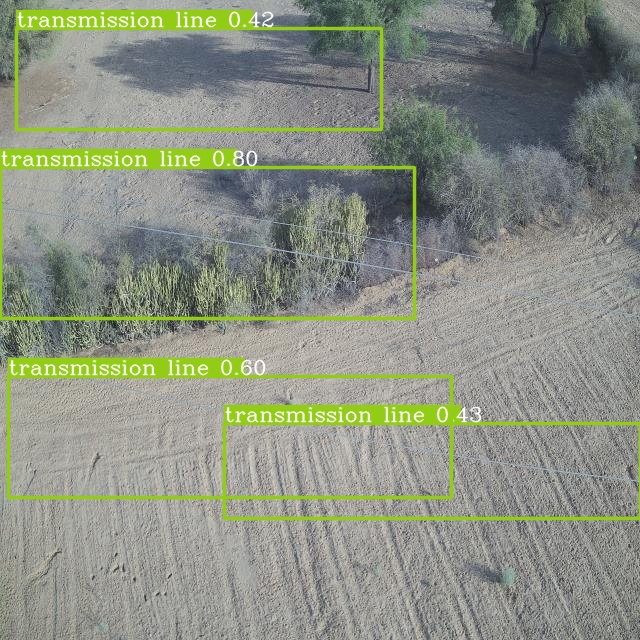

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0732_jpg.rf.d74ae26522b4c065e484187068b69baf.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

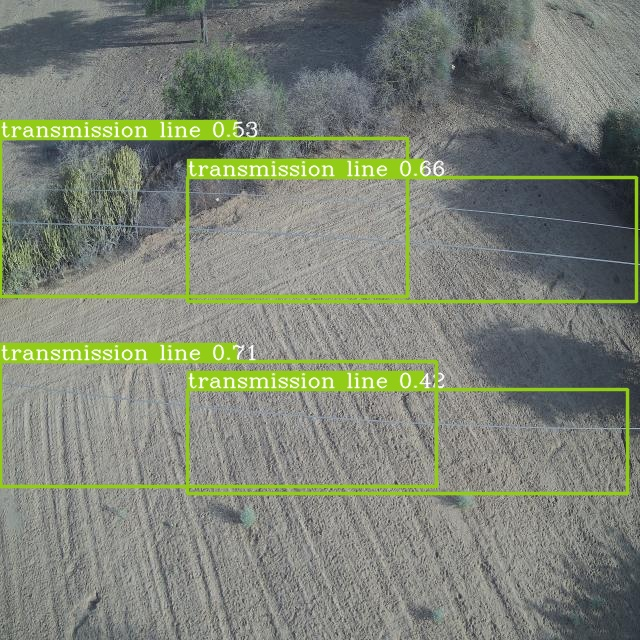

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0740_jpg.rf.ecf1f6464e62cba17373af85165cc04a.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

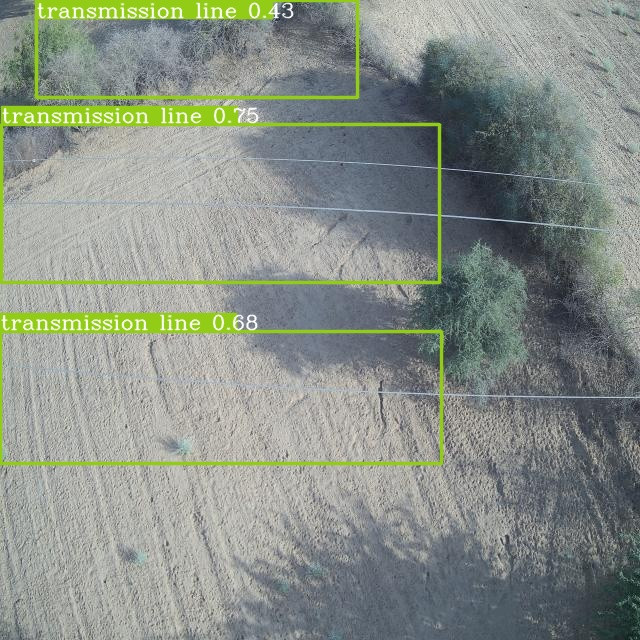

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0744_jpg.rf.9abee5b5821793b2d579862be7ca1611.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

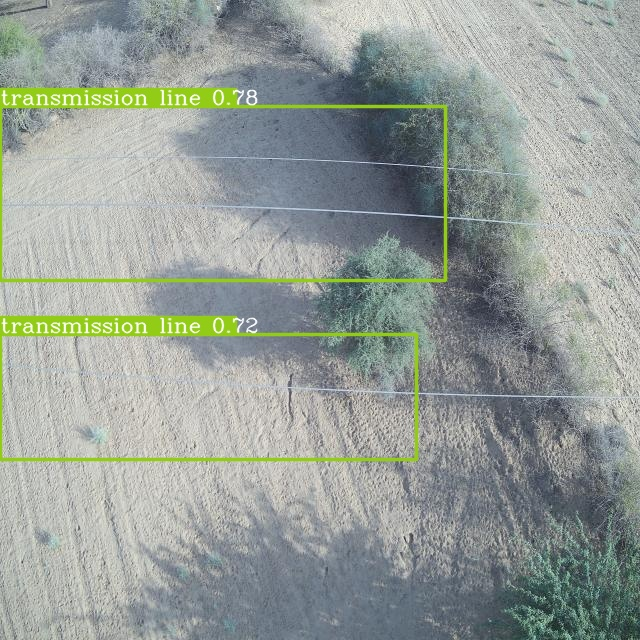

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0746_jpg.rf.b726b87665792a17a6daa4fb22fdd654.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

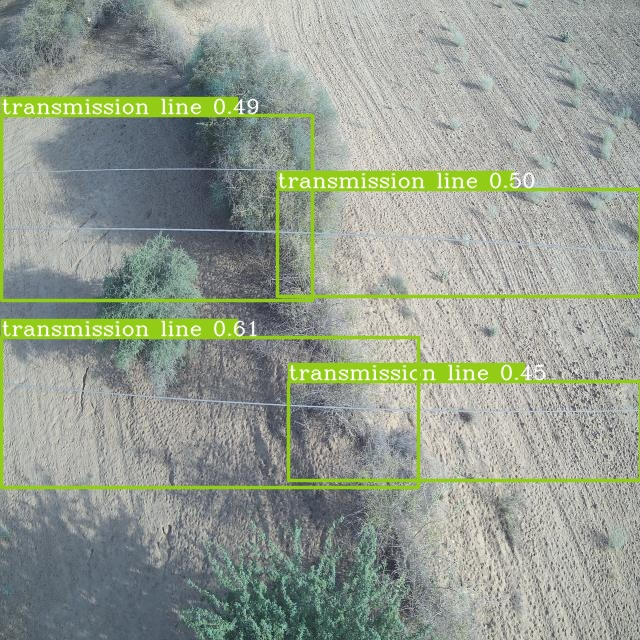

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0752_jpg.rf.8b16dc2c19d35b5b14c4f15043a1e4dd.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

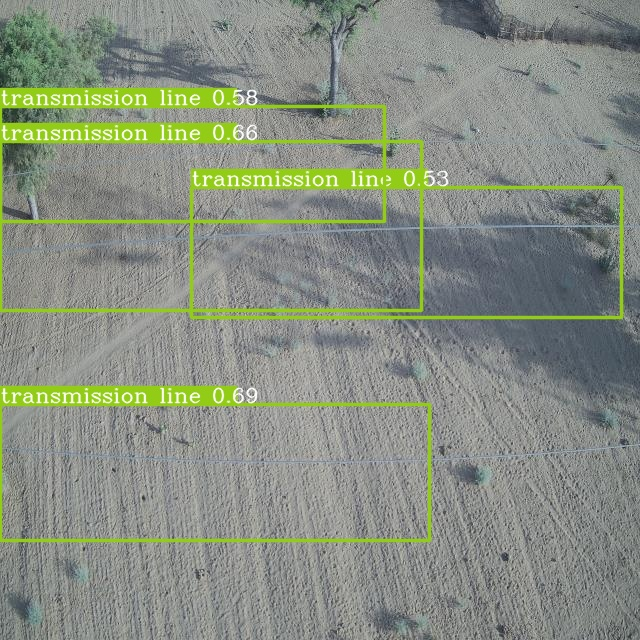

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0790_jpg.rf.3d4ceebbe4f67bacb93115193c8c7162.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

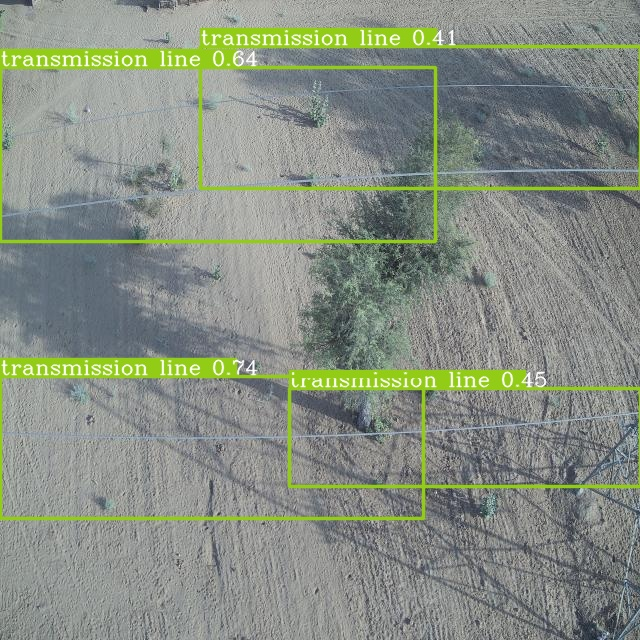

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0800_jpg.rf.439fcdd8ca8732aae4a723510df265cb.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

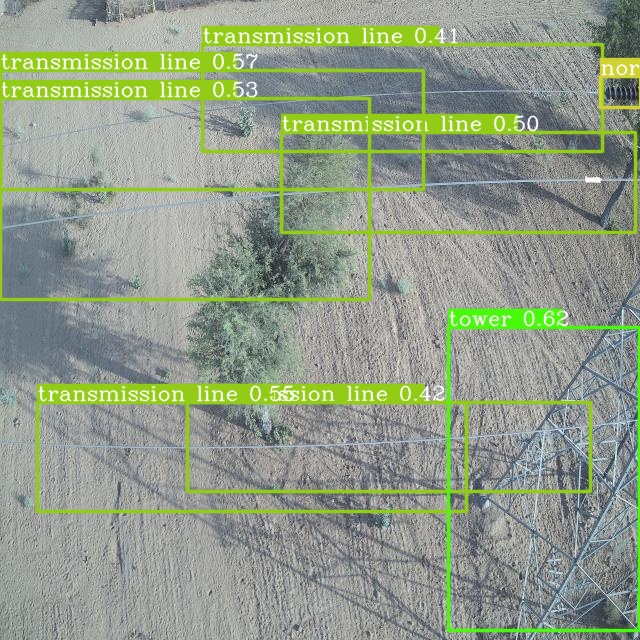

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0802-1_jpg.rf.edc9a64d045ee8a0bd359c516be76fc7.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

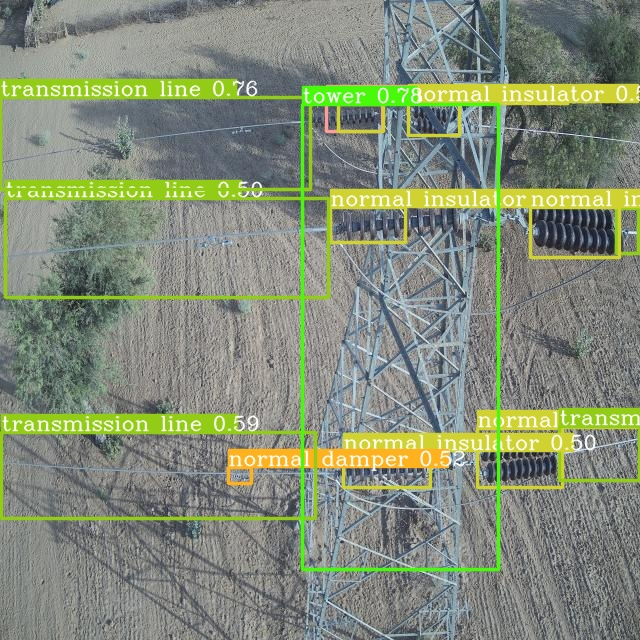

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0808_jpg.rf.d3d73608bc4a54d27a4dffa709ce0aee.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

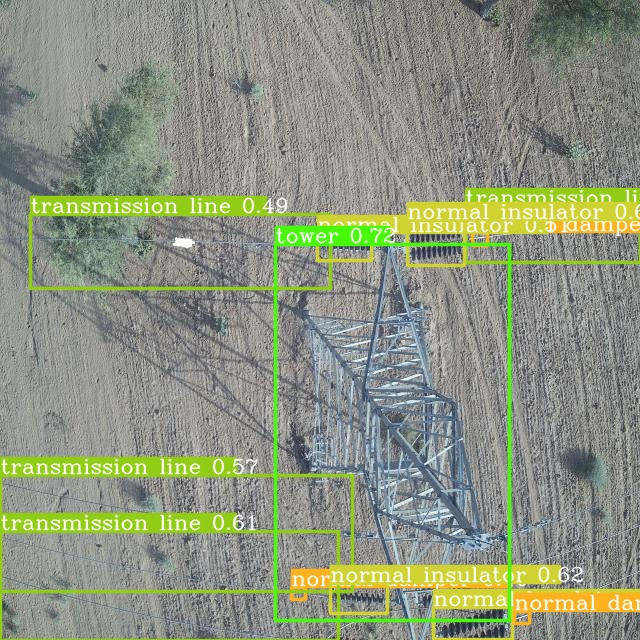

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0820-1_jpg.rf.cecf223ab55473d3e6f13527ea6ba5c9.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
import cv2
import os
import random
label_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/labels'
raw_images_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/images'
save_images_folder = r'/content/YOLOv6/save_images_test'
name_list_path = r'/content/YOLOv6/Transmission-dataset-T53-4/labels/test'
classes_path = r'/content/YOLOv6/Transmission-dataset-T53-4'
image_name=r'./runs/inference/exp/DJI_0820-1_jpg.rf.cecf223ab55473d3e6f13527ea6ba5c9.jpg'
label=name_of_class='defect transmission line'

def plot_one_box(x, image, color=None, label=name_of_class,line_thickness=None):

    tl = line_thickness or round(0.002 * (image.shape[0] + image.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(image, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label:
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(str(label), 0, fontScale=tl / 3,thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(image, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(image, str(label), (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
def draw_box_on_image(image_name, classes_path, label_folder, raw_images_folder, save_images_folder ):
    txt_path  = r"/content/YOLOv6/Transmission-dataset-T53-4/labels/test/DJI_0820-1_jpg.rf.cecf223ab55473d3e6f13527ea6ba5c9.txt"
    print(image_name)
    if image_name == '.DS_Store':
        return 0
    image_path = r"./runs/inference/exp/DJI_0820-1_jpg.rf.cecf223ab55473d3e6f13527ea6ba5c9.jpg"
    save_file_path = r"/content/YOLOv6/save_images_test/DJI_0820-1"
    source_file = open(txt_path) if os.path.exists(txt_path) else []
    image = cv2.imread(image_path)
    try:
        height, width, channels = image.shape
    except:
        print('no shape info.')
        return 0
    box_number = 0
    for line in source_file:
        staff = line.split()
        class_idx = int(staff[0])
        x_center, y_center, w, h = float(staff[1])*width, float(staff[2])*height, float(staff[3])*width, float(staff[4])*height
        x1 = round(x_center-w/2)
        y1 = round(y_center-h/2)
        x2 = round(x_center+w/2)
        y2 = round(y_center+h/2)
        plot_one_box([x1,y1,x2,y2], image,  label=name_of_class, line_thickness=None)
        cv2.imwrite(r"/content/YOLOv6/save_images_test/DJI_0820-1.jpg",image)
        box_number += 1
        return box_number
draw_box_on_image(image_name, classes_path,  label_folder, raw_images_folder, save_images_folder )





./runs/inference/exp/DJI_0820-1_jpg.rf.cecf223ab55473d3e6f13527ea6ba5c9.jpg


1

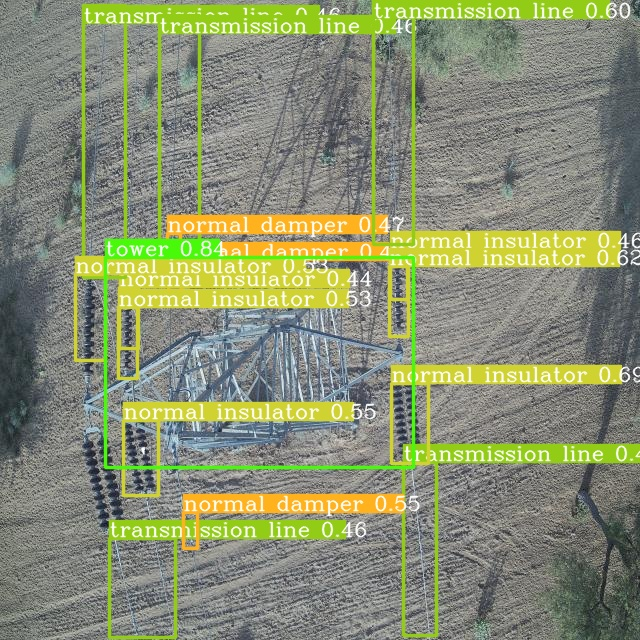

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0838-1_jpg.rf.7b5ef90a9742ff383601b901709dd596.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

In [ ]:
import cv2
import os
import random
label_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/labels'
raw_images_folder = r'/content/YOLOv6/Transmission-dataset-T53-4/images'
save_images_folder = r'/content/YOLOv6/save_images_test'
name_list_path = r'/content/YOLOv6/Transmission-dataset-T53-4/labels/test'
classes_path = r'/content/YOLOv6/Transmission-dataset-T53-4'
image_name=r'./runs/inference/exp/DJI_0838-1_jpg.rf.7b5ef90a9742ff383601b901709dd596.jpg'
label=name_of_class='defect insulator'

def plot_one_box(x, image, color=None, label=name_of_class,line_thickness=None):

    tl = line_thickness or round(0.002 * (image.shape[0] + image.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(image, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label:
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(str(label), 0, fontScale=tl / 3,thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(image, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(image, str(label), (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
def draw_box_on_image(image_name, classes_path, label_folder, raw_images_folder, save_images_folder ):
    txt_path  = r"/content/YOLOv6/Transmission-dataset-T53-4/labels/test/DJI_0838-1_jpg.rf.7b5ef90a9742ff383601b901709dd596.txt"
    print(image_name)
    if image_name == '.DS_Store':
        return 0
    image_path = r"./runs/inference/exp/DJI_0838-1_jpg.rf.7b5ef90a9742ff383601b901709dd596.jpg"
    save_file_path = r"/content/YOLOv6/save_images_test/DJI_0838-1"
    source_file = open(txt_path) if os.path.exists(txt_path) else []
    image = cv2.imread(image_path)
    try:
        height, width, channels = image.shape
    except:
        print('no shape info.')
        return 0
    box_number = 0
    for line in source_file:
        staff = line.split()
        class_idx = int(staff[0])
        x_center, y_center, w, h = float(staff[1])*width, float(staff[2])*height, float(staff[3])*width, float(staff[4])*height
        x1 = round(x_center-w/2)
        y1 = round(y_center-h/2)
        x2 = round(x_center+w/2)
        y2 = round(y_center+h/2)
        plot_one_box([x1,y1,x2,y2], image,  label=name_of_class, line_thickness=None)
        cv2.imwrite(r"/content/YOLOv6/save_images_test/DJI_0838-1.jpg",image)
        box_number += 1
        return box_number
draw_box_on_image(image_name, classes_path,  label_folder, raw_images_folder, save_images_folder )





./runs/inference/exp/DJI_0838-1_jpg.rf.7b5ef90a9742ff383601b901709dd596.jpg


1

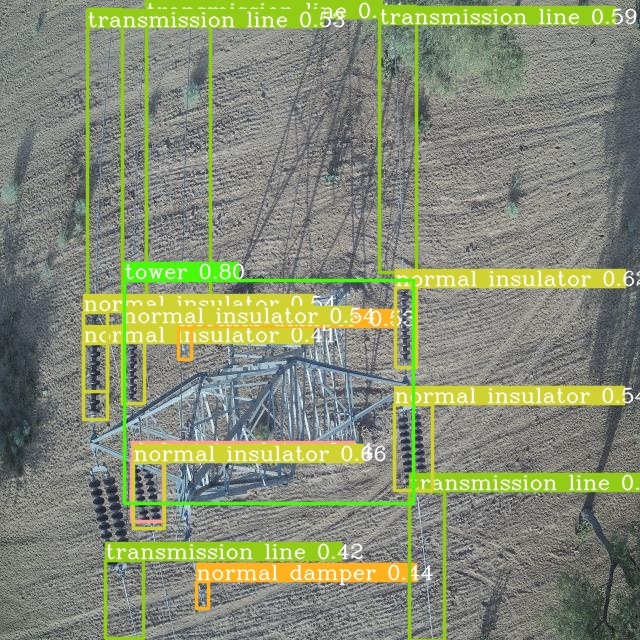

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0840_jpg.rf.fa25e8db1201a15e89c32e3b30060c2a.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

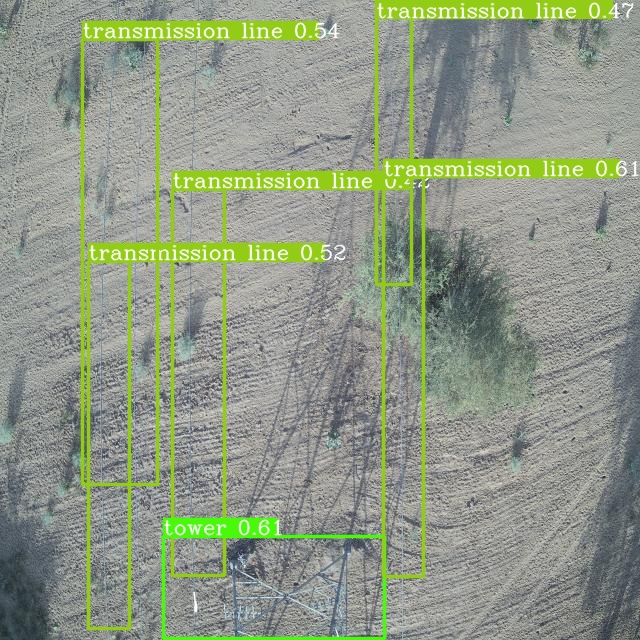

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0846_jpg.rf.8563fcd764eff983e829afa2be07fdd8.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

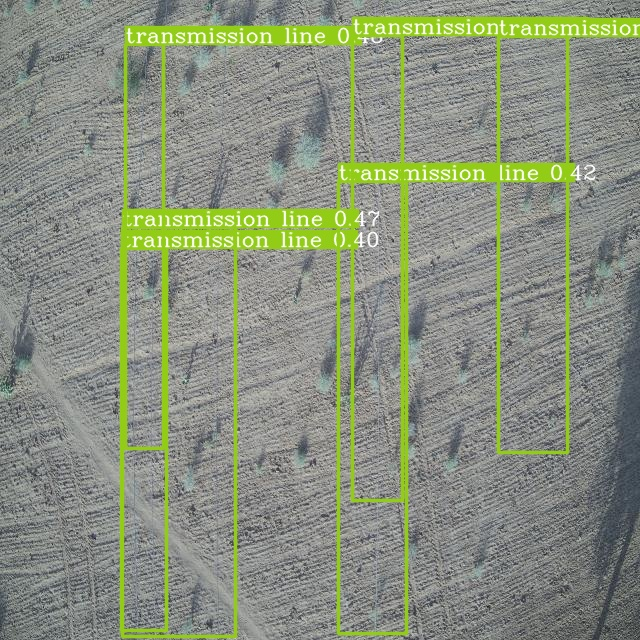

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0874_jpg.rf.2ba40dc06c4f25ac4d1ca256a0593e0f.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

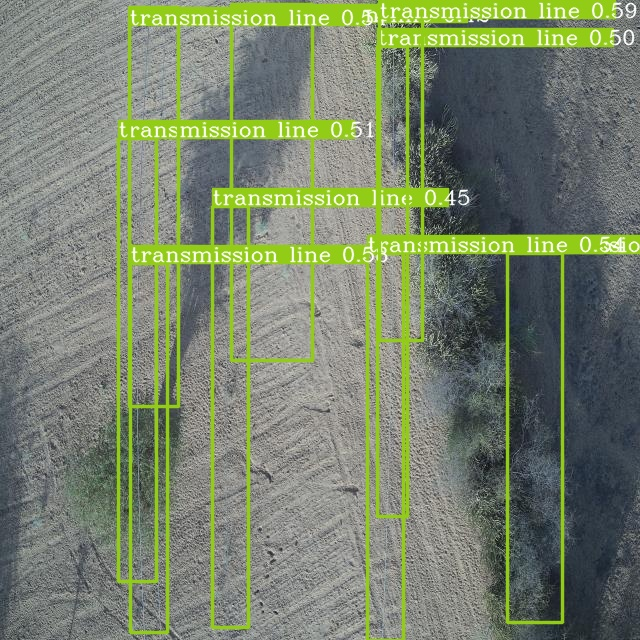

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0916_jpg.rf.292a95814df825b988605ff328884cb4.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

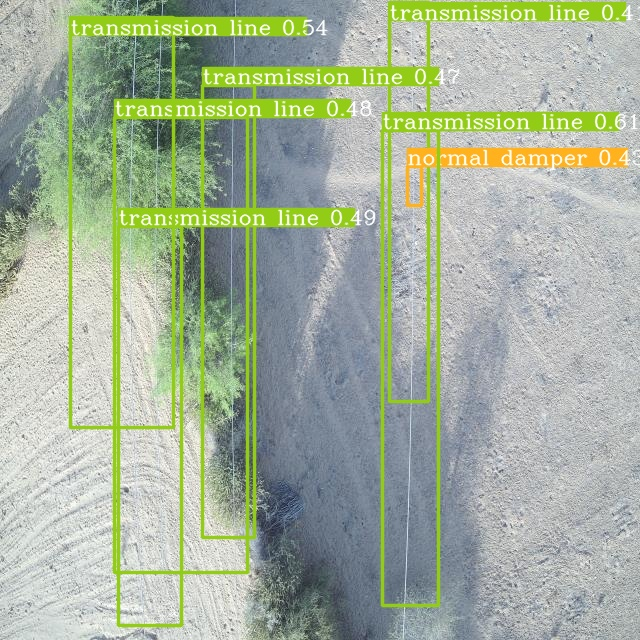

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0940_jpg.rf.36950fe4028353326282ed9fc2ff4d89.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

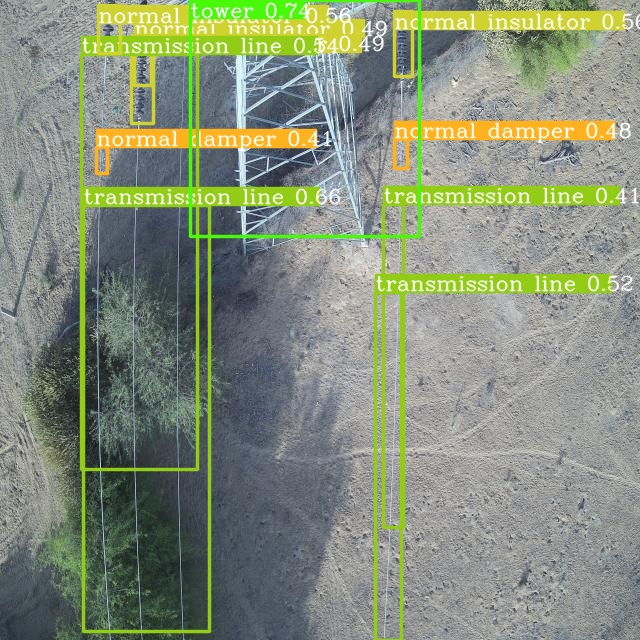

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0950_jpg.rf.4e4eb8c15ba096af572b98b320804b3d.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

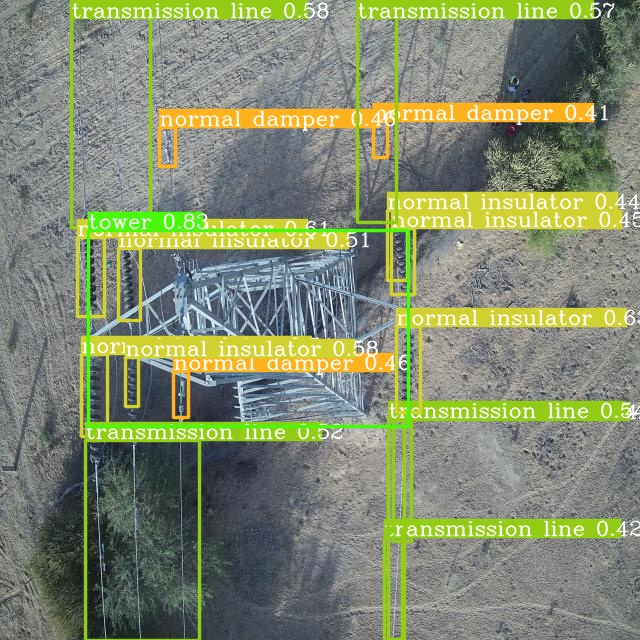

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0954-1_jpg.rf.65eb9b5e1961c5fe15aaf85dd36a2c34.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1

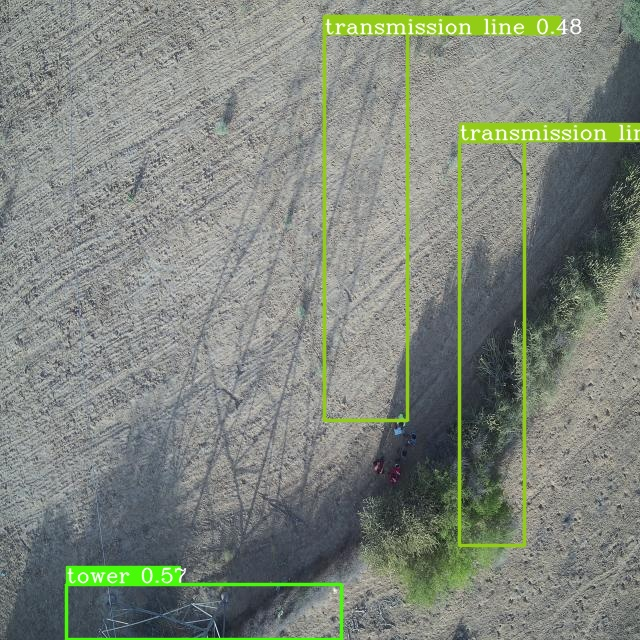

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 3 # max images to print
for imageName in glob.glob('./runs/inference/exp/DJI_0960_jpg.rf.405ee7a4cf77ed7d5e4143db085b1353.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n\n")
    i = i + 1